# Ajinomoto Data Analysis Notebook

In this notebook we compile all assays performed for the Ajinomoto Project on *E. coli* strains that were designed to produce the C12 Fatty alcohol dodecanol. Two complete cycles of design build test learn [DBTL] were performed. This document is a reproducable record of all analyses that were performed on the data and the resulting conclusions.

In [1]:
cd ../

/Users/zak/Documents/Projects/ajinomoto


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
from IPython.display import display
import matplotlib.pyplot as plt
from scipy import stats
import matplotlib.ticker as ticker


PROTEIN_NAMES = {'sp|P69451|LCFA_ECOLI': 'FadD',
                 'sp|Q41635|FATB_UMBCA': 'FatB',
                 'tr|A1U3L3|A1U3L3_MARHV': 'Maqu2507',
                 'tr|A1U2T0|A1U2T0_MARHV': 'Maqu2220',
                 'sp|Q6F7B8|ACR1_ACIAD': 'Acr1',
                 'sp|P27250|AHR_ECOLI': 'YjgB'
                }

#Import data into pandas dataframe
df = pd.read_csv('data/EDD_Ajinomoto_Data.csv',header=[0, 1], index_col=0, skipinitialspace=False)

### 1. Quality Checking and Data Cleaning

The data is cleaned and then measured for quality.

In [3]:
#Before Cleanup add some important columns for the analysis

#Add a Total Fatty Alcohols Column
df[('GC-MS','Total Fatty Alcohols')] = df['GC-MS'].sum(axis=1)

#### Proteomics Cleanup
We check to make sure protein is produced if and only if the associated gene is expressed. Some Protomics data suggests the presence of proteins in strains which were not present in the vectors. These protein counts are zeroed out to remove the spurious measurements if they are close to zero.

In [4]:
#Proteomics Clean-Up
from utility import clean_proteomics
df.loc[df[('Metadata','Cycle')]>0,df.columns.get_level_values(0)=='Targeted Proteomics'] = df.loc[df[('Metadata','Cycle')]>0].apply(clean_proteomics,axis=1).values

#### General Cleanup
Data points with a coefficient of variation over the threshold are removed. Optionally, everything below the given detection threshold is zeroed out for an assay.

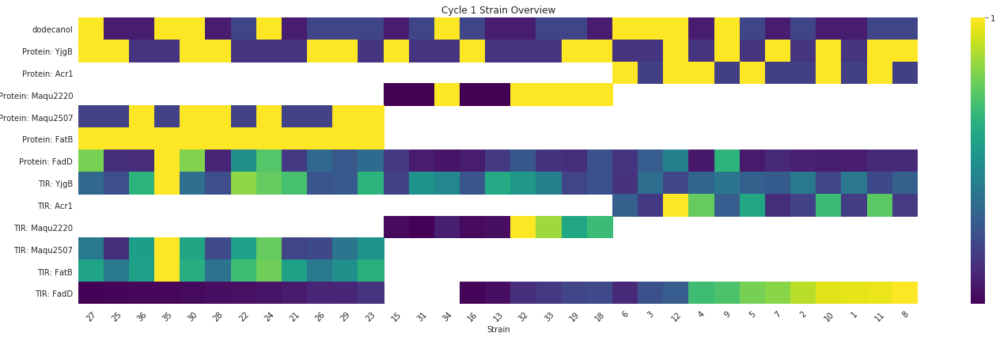

In [5]:
from plot import quality_plot, strain_heatmap,strain_plot3d

#Get strains in Cycle 1 - Sort By Reductase then by Production
heatmap_df = df.loc[df[('Metadata','Cycle')]==1].groupby([('Metadata','Strain')]).mean()
heatmap_df.loc[:,('Metadata','Pathway')] = heatmap_df.loc[:,('Metadata','Pathway')].replace({3:1,2:3,1:2})
heatmap_df = heatmap_df.sort_values([('Metadata','Pathway'),('GC-MS','dodecan-1-ol')])

strain_heatmap(heatmap_df)
plt.title('Cycle 1 Strain Overview')
plt.show()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:30: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view

Protocol Name                 EMOPEC                       \
Measurement Type sp|P27250|AHR_ECOLI sp|P69451|LCFA_ECOLI   
Line Name                                                   
C2-S7-B2.3-R1                    0.0                 92.4   
C2-S7-B2.3-R2                    0.0                 92.4   
C2-S7-B2.3-R3                    0.0                 92.4   
C2-S7-B2.5-R1                    0.0                 92.4   
C2-S7-B2.5-R2                    0.0                 92.4   
C2-S7-B2.5-R3                    0.0                 92.4   

Protocol Name                                               \
Measurement Type sp|Q41635|FATB_UMBCA sp|Q6F7B8|ACR1_ACIAD   
Line Name                                                    
C2-S7-B2.3-R1                    97.1                  0.0   
C2-S7-B2.3-R2                    97.1                  0.0   
C2-S7-B2.3-R3                    97.1                  0.0   
C2-S7-B2.5-R1                    97.1                  0.0   
C2-S7-B2.5-R2                    97.1                  0.0   
C2-S7-B2.5-R3                    97.1                  0.0   

Protocol Name                                                         GC-MS  \
Measurement Type tr|A1U2T0|A1U2T0_MARHV tr|A1U3L3|A1U3L3_MARHV dodecan-1-ol   
Line Name                                                                     
C2-S7-B2.3-R1                       0.0                   98.4          NaN   
C2-S7-B2.3-R2                       0.0                   98.4          NaN   
C2-S7-B2.3-R3                       0.0                   98.4          NaN   
C2-S7-B2.5-R1                       0.0                   98.4          NaN   
C2-S7-B2.5-R2                       0.0                   98.4          NaN   
C2-S7-B2.5-R3                       0.0                   98.4          NaN   

Protocol Name                                                   \
Measurement Type hexadecan-1-ol octadecan-1-ol tetradecan-1-ol   
Line Name                                                        
C2-S7-B2.3-R1               NaN            NaN             NaN   
C2-S7-B2.3-R2               NaN            NaN             NaN   
C2-S7-B2.3-R3               NaN            NaN             NaN   
C2-S7-B2.5-R1               NaN            NaN             NaN   
C2-S7-B2.5-R2               NaN            NaN             NaN   
C2-S7-B2.5-R3               NaN            NaN             NaN   

Protocol Name            ...           Targeted Proteomics  \
Measurement Type         ...          sp|P69451|LCFA_ECOLI   
Line Name                ...                                 
C2-S7-B2.3-R1            ...                           NaN   
C2-S7-B2.3-R2            ...                           NaN   
C2-S7-B2.3-R3            ...                           NaN   
C2-S7-B2.5-R1            ...                           NaN   
C2-S7-B2.5-R2            ...                           NaN   
C2-S7-B2.5-R3            ...                           NaN   

Protocol Name                                               \
Measurement Type sp|Q41635|FATB_UMBCA sp|Q6F7B8|ACR1_ACIAD   
Line Name                                                    
C2-S7-B2.3-R1                     NaN                  NaN   
C2-S7-B2.3-R2                     NaN                  NaN   
C2-S7-B2.3-R3                     NaN                  NaN   
C2-S7-B2.5-R1                     NaN                  NaN   
C2-S7-B2.5-R2                     NaN                  NaN   
C2-S7-B2.5-R3                     NaN                  NaN   

Protocol Name                                                  Metadata  \
Measurement Type tr|A1U2T0|A1U2T0_MARHV tr|A1U3L3|A1U3L3_MARHV     Time   
Line Name                                                                 
C2-S7-B2.3-R1                       NaN                    NaN       27   
C2-S7-B2.3-R2                       NaN                    NaN       27   
C2-S7-B2.3-R3                       NaN                    NaN       27   
C2-S7-B2.5-R1   

Protocol Name                 EMOPEC                       \
Measurement Type sp|P27250|AHR_ECOLI sp|P69451|LCFA_ECOLI   
Line Name                                                   
C2-S7-B2.3-R1                    0.0                 92.4   
C2-S7-B2.3-R2                    0.0                 92.4   
C2-S7-B2.3-R3                    0.0                 92.4   
C2-S7-B2.5-R1                    0.0                 92.4   
C2-S7-B2.5-R2                    0.0                 92.4   
C2-S7-B2.5-R3                    0.0                 92.4   

Protocol Name                                               \
Measurement Type sp|Q41635|FATB_UMBCA sp|Q6F7B8|ACR1_ACIAD   
Line Name                                                    
C2-S7-B2.3-R1                    97.1                  0.0   
C2-S7-B2.3-R2                    97.1                  0.0   
C2-S7-B2.3-R3                    97.1                  0.0   
C2-S7-B2.5-R1                    97.1                  0.0   
C2-S7-B2.5-R2                    97.1                  0.0   
C2-S7-B2.5-R3                    97.1                  0.0   

Protocol Name                                                         GC-MS  \
Measurement Type tr|A1U2T0|A1U2T0_MARHV tr|A1U3L3|A1U3L3_MARHV dodecan-1-ol   
Line Name                                                                     
C2-S7-B2.3-R1                       0.0                   98.4          NaN   
C2-S7-B2.3-R2                       0.0                   98.4          NaN   
C2-S7-B2.3-R3                       0.0                   98.4          NaN   
C2-S7-B2.5-R1                       0.0                   98.4          NaN   
C2-S7-B2.5-R2                       0.0                   98.4          NaN   
C2-S7-B2.5-R3                       0.0                   98.4          NaN   

Protocol Name                                                   \
Measurement Type hexadecan-1-ol octadecan-1-ol tetradecan-1-ol   
Line Name                                                        
C2-S7-B2.3-R1               NaN            NaN             NaN   
C2-S7-B2.3-R2               NaN            NaN             NaN   
C2-S7-B2.3-R3               NaN            NaN             NaN   
C2-S7-B2.5-R1               NaN            NaN             NaN   
C2-S7-B2.5-R2               NaN            NaN             NaN   
C2-S7-B2.5-R3               NaN            NaN             NaN   

Protocol Name            ...           Targeted Proteomics  \
Measurement Type         ...          sp|P69451|LCFA_ECOLI   
Line Name                ...                                 
C2-S7-B2.3-R1            ...                           NaN   
C2-S7-B2.3-R2            ...                           NaN   
C2-S7-B2.3-R3            ...                           NaN   
C2-S7-B2.5-R1            ...                           NaN   
C2-S7-B2.5-R2            ...                           NaN   
C2-S7-B2.5-R3            ...                           NaN   

Protocol Name                                               \
Measurement Type sp|Q41635|FATB_UMBCA sp|Q6F7B8|ACR1_ACIAD   
Line Name                                                    
C2-S7-B2.3-R1                     NaN                  NaN   
C2-S7-B2.3-R2                     NaN                  NaN   
C2-S7-B2.3-R3                     NaN                  NaN   
C2-S7-B2.5-R1                     NaN                  NaN   
C2-S7-B2.5-R2                     NaN                  NaN   
C2-S7-B2.5-R3                     NaN                  NaN   

Protocol Name                                                  Metadata  \
Measurement Type tr|A1U2T0|A1U2T0_MARHV tr|A1U3L3|A1U3L3_MARHV     Time   
Line Name                                                                 
C2-S7-B2.3-R1                       NaN                    NaN       27   
C2-S7-B2.3-R2                       NaN                    NaN       27   
C2-S7-B2.3-R3                       NaN                    NaN       27   
C2-S7-B2.5-R1   

Protocol Name                 EMOPEC                       \
Measurement Type sp|P27250|AHR_ECOLI sp|P69451|LCFA_ECOLI   
Line Name                                                   
C2-S7-B2.3-R1                    0.0                 92.4   
C2-S7-B2.3-R2                    0.0                 92.4   
C2-S7-B2.3-R3                    0.0                 92.4   
C2-S7-B2.5-R1                    0.0                 92.4   
C2-S7-B2.5-R2                    0.0                 92.4   
C2-S7-B2.5-R3                    0.0                 92.4   

Protocol Name                                               \
Measurement Type sp|Q41635|FATB_UMBCA sp|Q6F7B8|ACR1_ACIAD   
Line Name                                                    
C2-S7-B2.3-R1                    97.1                  0.0   
C2-S7-B2.3-R2                    97.1                  0.0   
C2-S7-B2.3-R3                    97.1                  0.0   
C2-S7-B2.5-R1                    97.1                  0.0   
C2-S7-B2.5-R2                    97.1                  0.0   
C2-S7-B2.5-R3                    97.1                  0.0   

Protocol Name                                                         GC-MS  \
Measurement Type tr|A1U2T0|A1U2T0_MARHV tr|A1U3L3|A1U3L3_MARHV dodecan-1-ol   
Line Name                                                                     
C2-S7-B2.3-R1                       0.0                   98.4          NaN   
C2-S7-B2.3-R2                       0.0                   98.4          NaN   
C2-S7-B2.3-R3                       0.0                   98.4          NaN   
C2-S7-B2.5-R1                       0.0                   98.4          NaN   
C2-S7-B2.5-R2                       0.0                   98.4          NaN   
C2-S7-B2.5-R3                       0.0                   98.4          NaN   

Protocol Name                                                   \
Measurement Type hexadecan-1-ol octadecan-1-ol tetradecan-1-ol   
Line Name                                                        
C2-S7-B2.3-R1               NaN            NaN             NaN   
C2-S7-B2.3-R2               NaN            NaN             NaN   
C2-S7-B2.3-R3               NaN            NaN             NaN   
C2-S7-B2.5-R1               NaN            NaN             NaN   
C2-S7-B2.5-R2               NaN            NaN             NaN   
C2-S7-B2.5-R3               NaN            NaN             NaN   

Protocol Name            ...           Targeted Proteomics  \
Measurement Type         ...          sp|P69451|LCFA_ECOLI   
Line Name                ...                                 
C2-S7-B2.3-R1            ...                           NaN   
C2-S7-B2.3-R2            ...                           NaN   
C2-S7-B2.3-R3            ...                           NaN   
C2-S7-B2.5-R1            ...                           NaN   
C2-S7-B2.5-R2            ...                           NaN   
C2-S7-B2.5-R3            ...                           NaN   

Protocol Name                                               \
Measurement Type sp|Q41635|FATB_UMBCA sp|Q6F7B8|ACR1_ACIAD   
Line Name                                                    
C2-S7-B2.3-R1                     NaN                  NaN   
C2-S7-B2.3-R2                     NaN                  NaN   
C2-S7-B2.3-R3                     NaN                  NaN   
C2-S7-B2.5-R1                     NaN                  NaN   
C2-S7-B2.5-R2                     NaN                  NaN   
C2-S7-B2.5-R3                     NaN                  NaN   

Protocol Name                                                  Metadata  \
Measurement Type tr|A1U2T0|A1U2T0_MARHV tr|A1U3L3|A1U3L3_MARHV     Time   
Line Name                                                                 
C2-S7-B2.3-R1                       NaN                    NaN       27   
C2-S7-B2.3-R2                       NaN                    NaN       27   
C2-S7-B2.3-R3                       NaN                    NaN       27   
C2-S7-B2.5-R1   

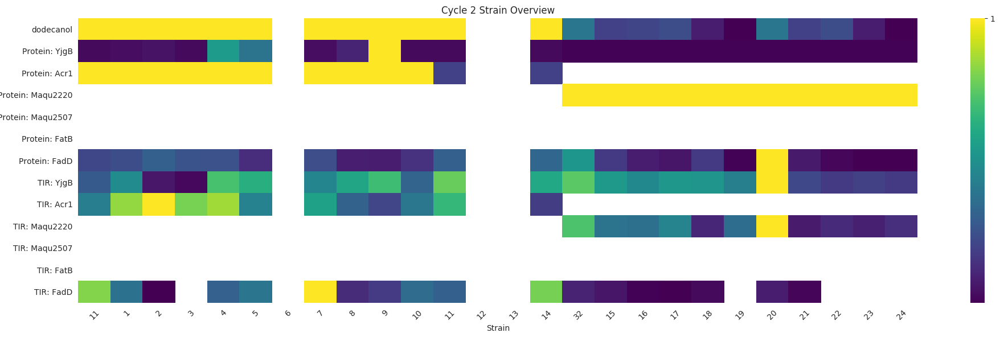

In [6]:
#Create a Cycle 2 Strain Heatmap!

#Get Strains in Cycle
#display(df['Metadata'])
#display(df[('Metadata','Batch')][100:150])
#C1-11 (batch2-3 & 2-5)*,C2-1, -2, -3, -4, -5, -6, -7*, -8, -9, -10, -11, -12, -13, -14, C1-32**, C2-15, -16, -17, -18, 19, -20, -21, -22, -23, -24
order = [(1,11,(4,6)),
         (2,1,None),(2,2,None),(2,3,None),(2,4,None),(2,5,None),(2,6,None),
         (2,7,(4,6)),
         (2,8,None),(2,9,None),(2,10,None),(2,11,None),(2,12,None),(2,13,None),(2,14,None),
         (1,32,(4,5,6)),(2,15,None),(2,16,None),(2,17,None),(2,18,None),(2,19,None),
         (2,20,None),(2,21,None),(2,22,None),(2,23,None),(2,24,None)
        ]

#Create an Empty row for Strain 6
CYCLE = df[('Metadata','Cycle')]==2
STRAIN = df[('Metadata','Strain')]==7

#display(strain_6)
#NaN out all Required Columns in strain_6 df

heatmap_df = pd.DataFrame()
for cycle,strain,allowed_batches in order:
    
    
    if strain in [6,12,13]:
        CYCLE = df[('Metadata','Cycle')]==2
        STRAIN = df[('Metadata','Strain')]==7
        strain_6 = df.loc[CYCLE & STRAIN]
        strain_6[('Metadata','Strain')] = strain
        strain_6['Targeted Proteomics'] = float('NaN')
        strain_6['TIR'] = float('NaN')
        strain_6['GC-MS'] = float('NaN')
        strain_df = strain_6
        display(strain_df)
    else:
        CYCLE = df[('Metadata','Cycle')]==cycle
        STRAIN = df[('Metadata','Strain')]==strain
        if allowed_batches is None:
            strain_df = df.loc[CYCLE & STRAIN]
        else:
            BATCH = df[('Metadata','Batch')].isin(allowed_batches)
            strain_df = df.loc[CYCLE & STRAIN & BATCH]
            
    #display(strain_df)
    strain_df = strain_df.groupby([('Metadata','Strain')]).mean()
    heatmap_df = pd.concat([heatmap_df,strain_df])
    
    #Concatenate To heatmap_df
#Get Strains For Heatmap 2
#heatmap_df = df.loc[df[('Metadata','Cycle')]==1].groupby([('Metadata','Strain')]).mean()
#heatmap_df.loc[:,('Metadata','Pathway')] = heatmap_df.loc[:,('Metadata','Pathway')].replace({3:1,2:3,1:2})


#heatmap_df['Order'] = 

#Order Strains Properly
#heatmap_df = heatmap_df.sort_values([('Metadata','Pathway'),('GC-MS','dodecan-1-ol')])

strain_heatmap(heatmap_df,save_file='figures/cycle2_heatmap.pdf',drop_columns=False)
plt.title('Cycle 2 Strain Overview')
plt.show()

/Users/zak/Documents/Projects/ajinomoto/plot.py:275: RuntimeWarning:

divide by zero encountered in log10

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



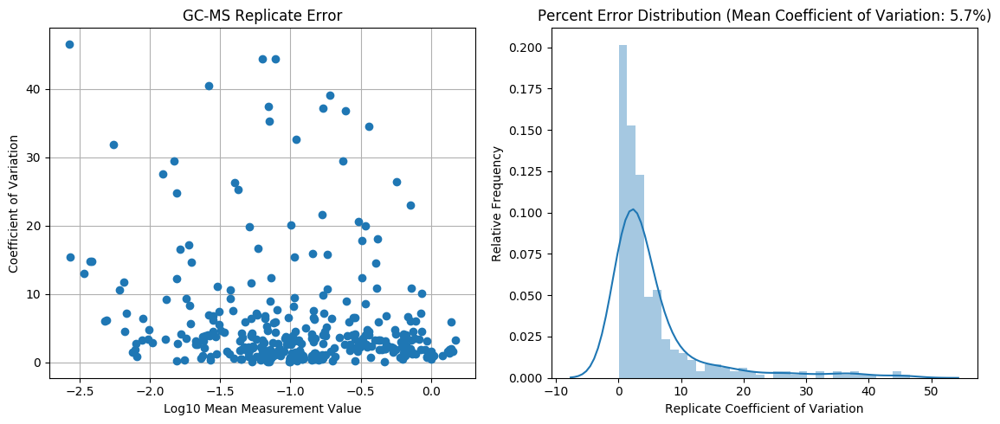

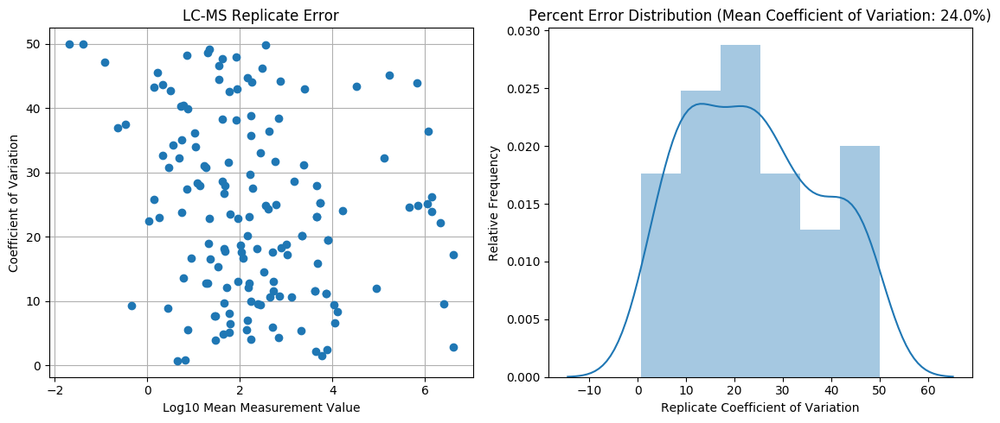

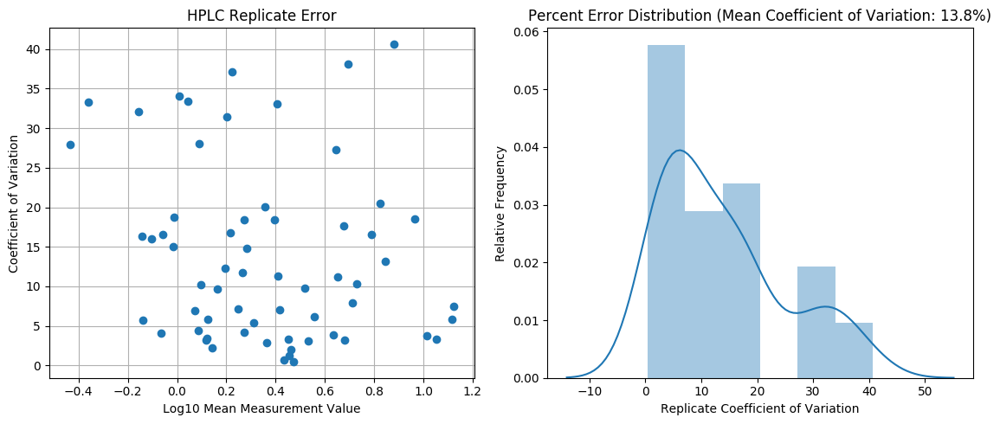

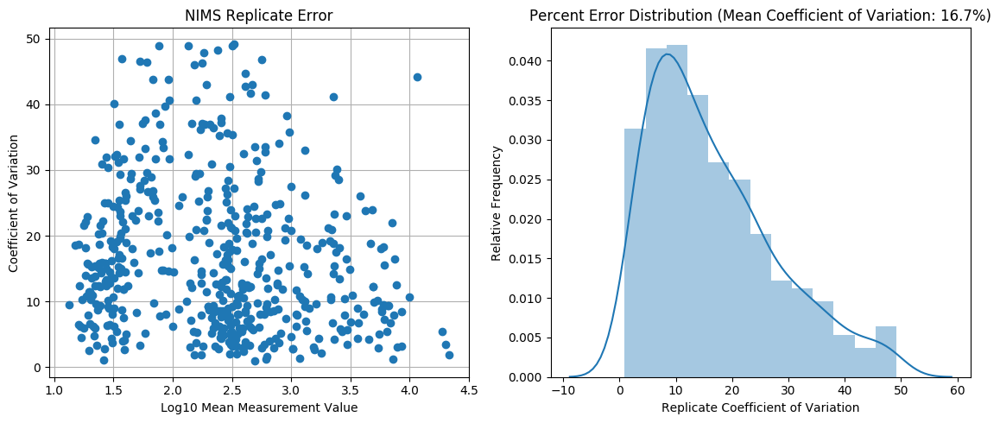

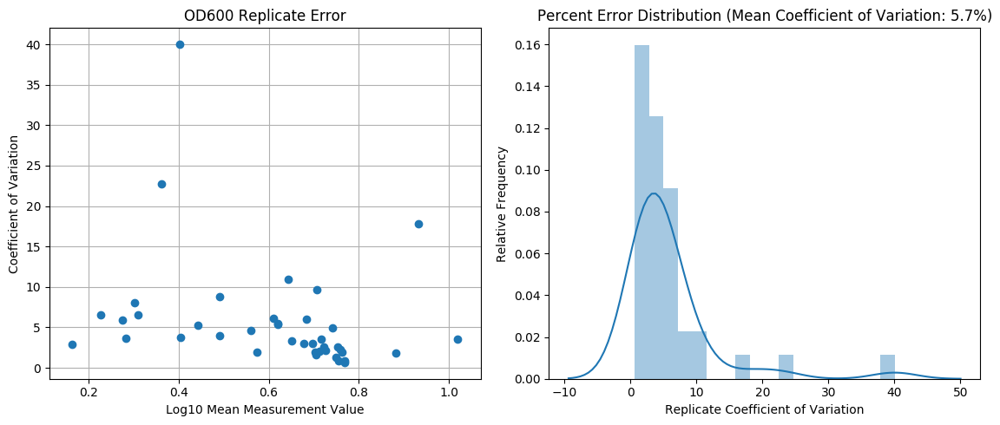

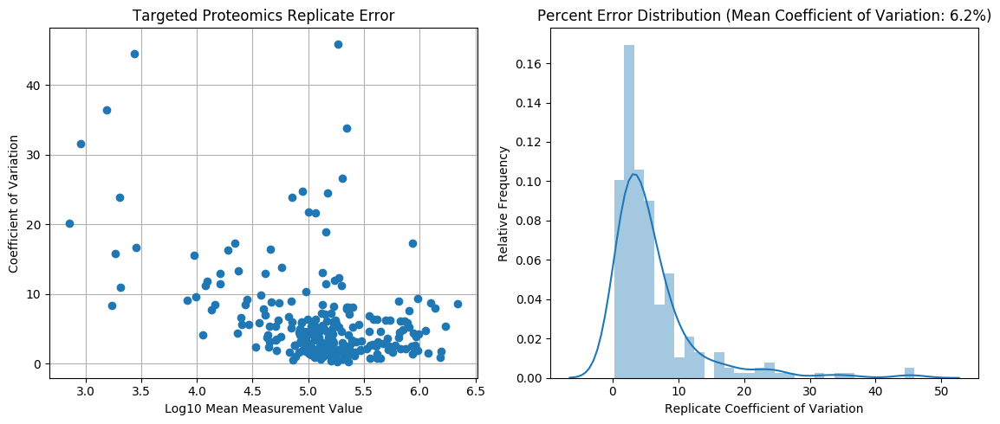

In [7]:
#Clean Data 
from utility import clean_data
assay_types = ['GC-MS','LC-MS','HPLC','NIMS','OD600','Targeted Proteomics']
assay_df_slice = df.loc[:,df.columns.get_level_values(0).isin(assay_types+['Metadata'])]

#df.loc[:,df.columns.get_level_values(0).isin(assay_types)]
df.loc[:,df.columns.get_level_values(0).isin(assay_types)] = clean_data(assay_df_slice,CoV_threshold=0.5)
quality_plot(df,assay_types)

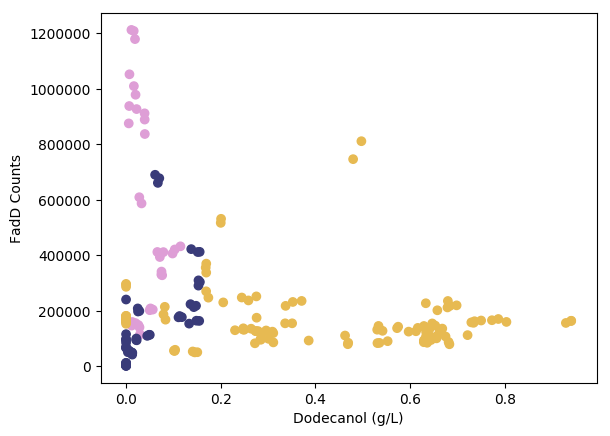

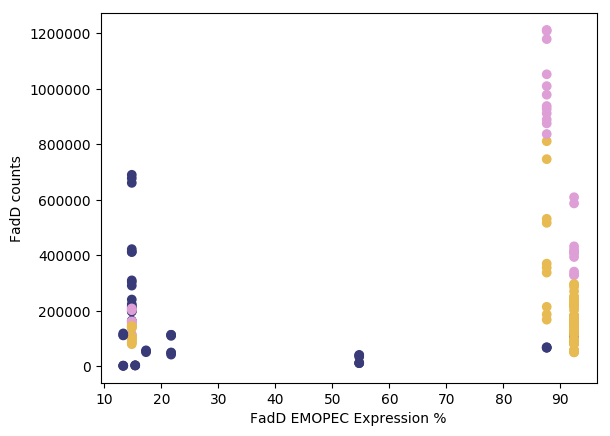

Protocol Name,GC-MS,Targeted Proteomics
Measurement Type,dodecan-1-ol,sp|P69451|LCFA_ECOLI
Line Name,,
C1-S1-B1.1-R1,0.72127,111883.0
C1-S1-B1.1-R2,0.65691,109006.0
C1-S2-B1.1-R1,0.67474,106977.0
C1-S2-B1.1-R2,0.46250,110415.0
C1-S4-B1.1-R1,0.46831,79192.0
C1-S4-B1.1-R2,0.46912,84364.0
C1-S8-B1.1-R1,0.77272,165598.0
C1-S8-B1.1-R2,0.78618,169995.0


R Value: -0.23166265096353925, P Value: 0.0010546653841633081


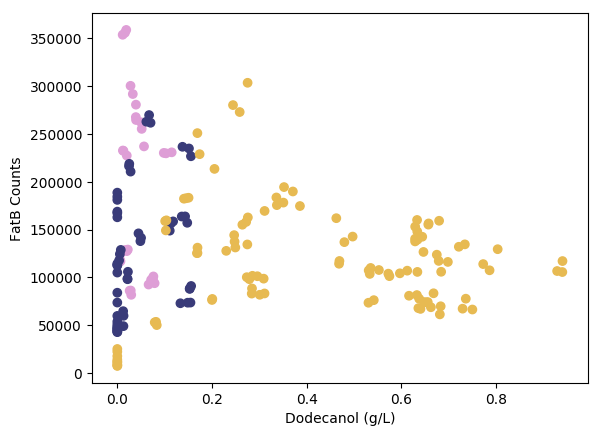

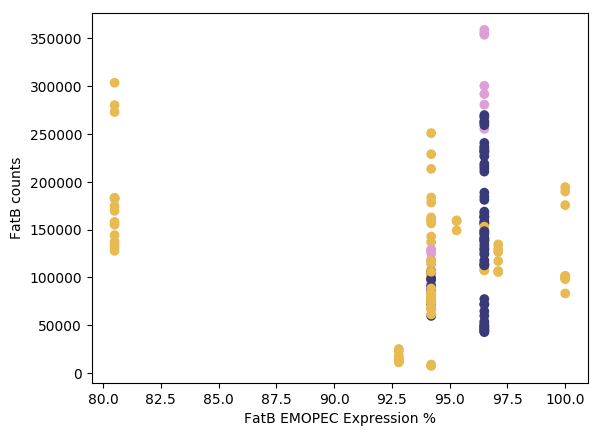

Protocol Name,GC-MS,Targeted Proteomics
Measurement Type,dodecan-1-ol,sp|Q41635|FATB_UMBCA
Line Name,,
C1-S1-B1.1-R1,0.72127,131969.0
C1-S1-B1.1-R2,0.65691,155128.0
C1-S2-B1.1-R1,0.67474,123692.0
C1-S2-B1.1-R2,0.46250,161836.0
C1-S4-B1.1-R1,0.46831,114226.0
C1-S4-B1.1-R2,0.46912,117131.0
C1-S8-B1.1-R1,0.77272,113884.0
C1-S8-B1.1-R2,0.78618,107398.0


R Value: -0.14103205163493715, P Value: 0.04982428469327857


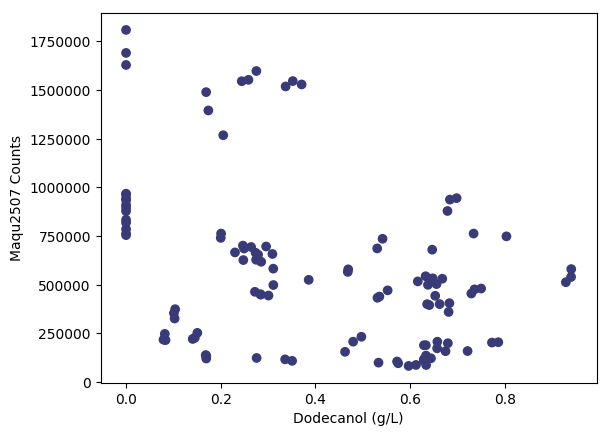

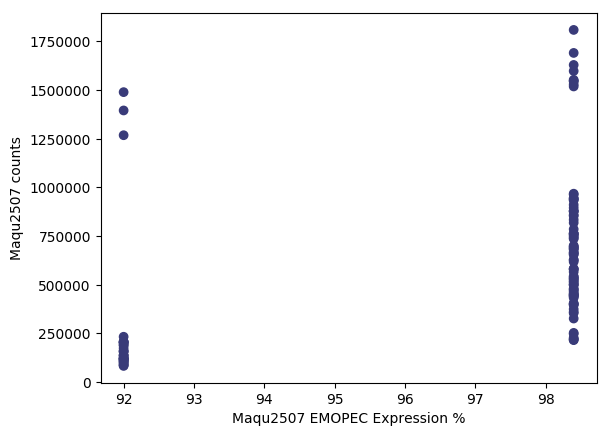

Protocol Name,GC-MS,Targeted Proteomics
Measurement Type,dodecan-1-ol,tr|A1U3L3|A1U3L3_MARHV
Line Name,,
C1-S1-B1.1-R1,0.72127,159144.0
C1-S1-B1.1-R2,0.65691,173165.0
C1-S2-B1.1-R1,0.67474,158408.0
C1-S2-B1.1-R2,0.46250,155221.0
C1-S4-B1.1-R1,0.46831,565758.0
C1-S4-B1.1-R2,0.46912,579082.0
C1-S8-B1.1-R1,0.77272,202718.0
C1-S8-B1.1-R2,0.78618,204510.0


R Value: -0.4016425069315037, P Value: 1.0376198926742903e-05


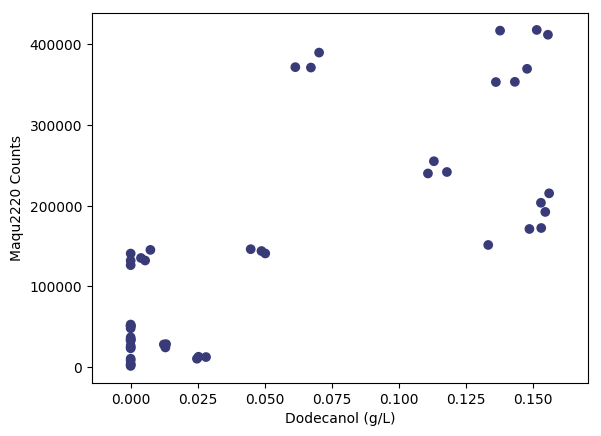

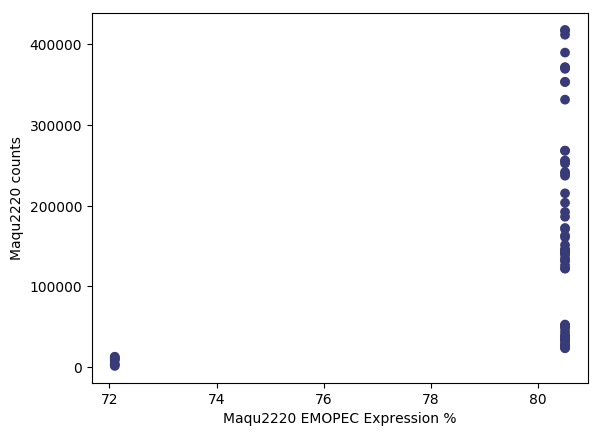

Protocol Name,GC-MS,Targeted Proteomics
Measurement Type,dodecan-1-ol,tr|A1U2T0|A1U2T0_MARHV
Line Name,,
C1-S15-B1.1-R1,0.00000,8372.0
C1-S15-B1.1-R2,0.00000,10438.0
C1-S19-B1.2-R1,0.15449,192296.0
C1-S19-B1.2-R2,0.14858,171189.0
C1-S19-B1.2-R3,0.13323,151364.0
C1-S31-B1.2-R1,0.00000,2850.0
C1-S31-B1.2-R2,0.00000,3875.0
C1-S31-B1.2-R3,0.00000,1455.0


R Value: 0.7742960624600496, P Value: 4.227549050331925e-11


In [8]:
protein_name_pairs = [('sp|P69451|LCFA_ECOLI','FadD'),
                      ('sp|Q41635|FATB_UMBCA','FatB'),
                      ('tr|A1U3L3|A1U3L3_MARHV','Maqu2507'),
                      ('tr|A1U2T0|A1U2T0_MARHV','Maqu2220')] 


for protein,name in protein_name_pairs:
    pth_df = df.loc[df[('Metadata','Pathway')]>0]
    if name in ['Maqu2507','Maqu2220']:
        pth_df = pth_df.loc[pth_df[('Targeted Proteomics',protein)]>0]
    
    #Plot Correlations between Protein MS Counts and Dodecanol
    plt.scatter(pth_df[('GC-MS','dodecan-1-ol')],
                pth_df[('Targeted Proteomics',protein)],
                c=pth_df[('Metadata','Pathway')],
                cmap=plt.get_cmap('tab20b'))
    plt.xlabel('Dodecanol (g/L)')
    plt.ylabel('{} Counts'.format(name))
    plt.savefig('figures/{}vsDodecanol.png'.format(name),dpi=600)
    plt.show()
    
    #Plot Correlations between TIR and Protein MS Counts
    plt.scatter(pth_df[('EMOPEC',protein)],
                pth_df[('Targeted Proteomics',protein)],
                c=pth_df[('Metadata','Pathway')],
                cmap=plt.get_cmap('tab20b'))
    plt.xlabel('{} EMOPEC Expression %'.format(name))
    plt.ylabel('{} counts'.format(name))
    plt.savefig('figures/{}EMOPECvsCounts.png'.format(name),dpi=600)
    plt.show()
    
    pth_df = pth_df.dropna(subset=[('GC-MS','dodecan-1-ol'),('Targeted Proteomics',protein)])    
    display(pth_df[[('GC-MS','dodecan-1-ol'),('Targeted Proteomics',protein)]])
    corr,pval = stats.pearsonr(pth_df[('GC-MS','dodecan-1-ol')], pth_df[('Targeted Proteomics',protein)])
    print('R Value: {}, P Value: {}'.format(corr,pval))




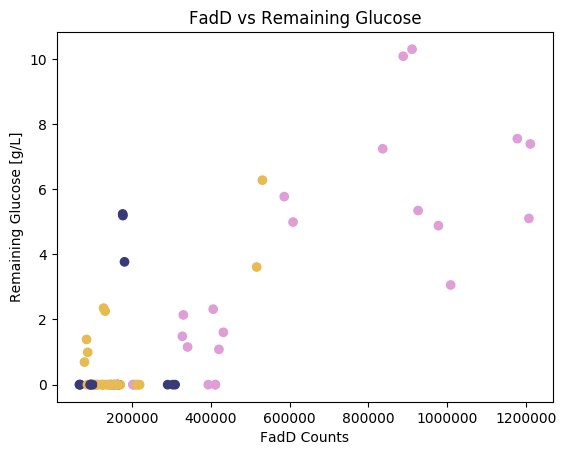

R Value: 0.8070203304343926, P Value: 1.1071570457658764e-20


In [9]:
CYCLE_1 = df[('Metadata','Cycle')] == 1
pth_df = df.loc[(df[('Metadata','Pathway')]>0) & CYCLE_1]

FadD_counts = pth_df[('Targeted Proteomics','sp|P69451|LCFA_ECOLI')]
glu_rem = pth_df[('HPLC','D-Glucose')]
pathway = pth_df[('Metadata','Pathway')]
plt.scatter(FadD_counts,glu_rem,c=pathway,cmap=plt.get_cmap('tab20b'))
plt.xlabel('FadD Counts')
plt.ylabel('Remaining Glucose [g/L]')
plt.title('FadD vs Remaining Glucose')
plt.savefig('figures/FadDvsGlucose.pdf',dpi=600)
plt.show()

pth_df = pth_df.dropna(subset=[('HPLC','D-Glucose'),('Targeted Proteomics','sp|P69451|LCFA_ECOLI')])
FadD_counts = pth_df[('Targeted Proteomics','sp|P69451|LCFA_ECOLI')]
glu_rem = pth_df[('HPLC','D-Glucose')]
corr,pval = stats.pearsonr(FadD_counts, glu_rem)
print('R Value: {}, P Value: {}'.format(corr,pval))


Now that the data is cleaned we can visualize the Coefficient of Variation of The measurements for each assay type.

In [10]:
#Create a Set of Strain Plots, with and without target data!
#for pathway in range(1,3):
#    for show_targets in [True,False]:
#        group_columns = [('Metadata',col) for col in ['Cycle','Strain','IPTG']]
#        strain_plot3d(df.groupby(group_columns).mean().reset_index(),pathway=pathway,show_targets=show_targets)
#        
#Calculate all distances 


#### Comprehensive Batch Effect Analysis

In order to ensure that experimental measurement variations accurately represent the biology instead of the assay technique we conduct a series of batch to batch constistency checks. To do this we look for strains that had the same genotype and experimental conditions and were used in multiple batches. The Assays are plotted for that strain across the batches.

/usr/local/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



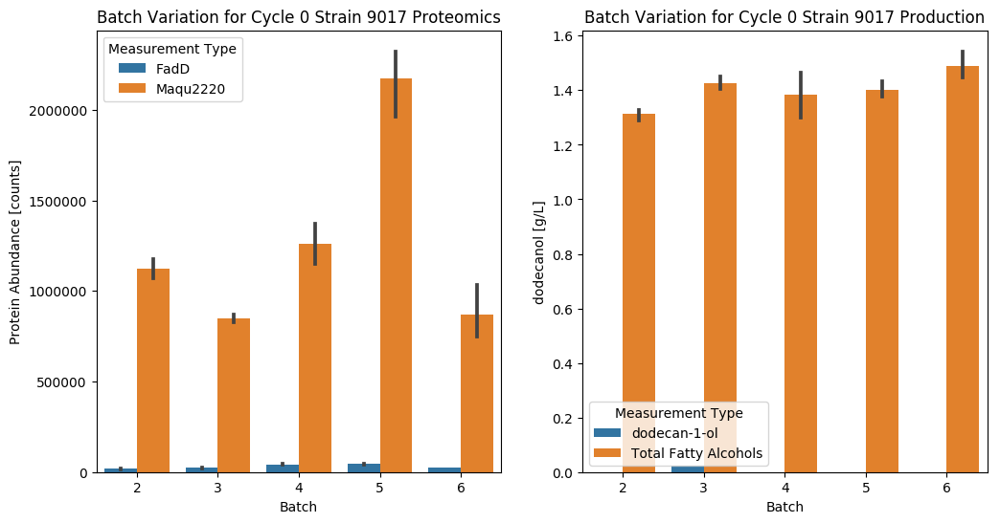

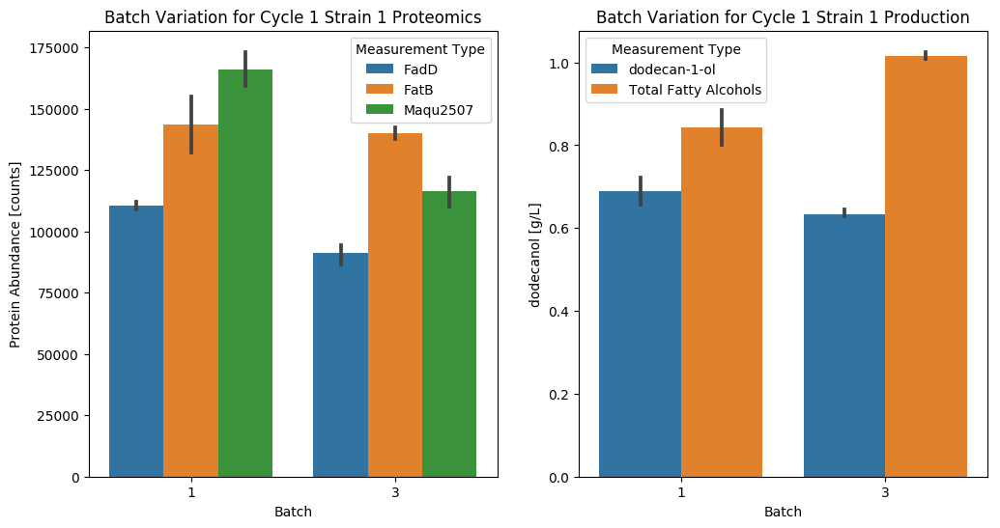

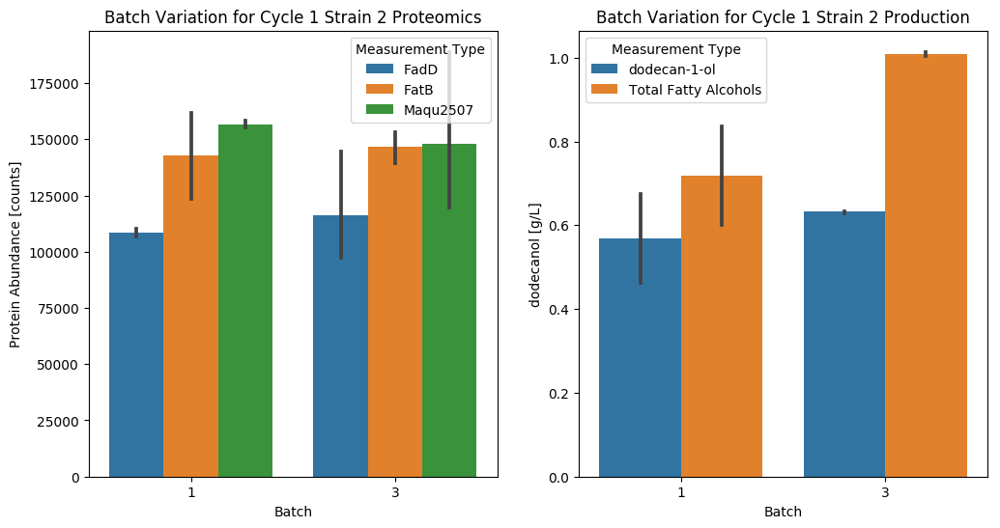

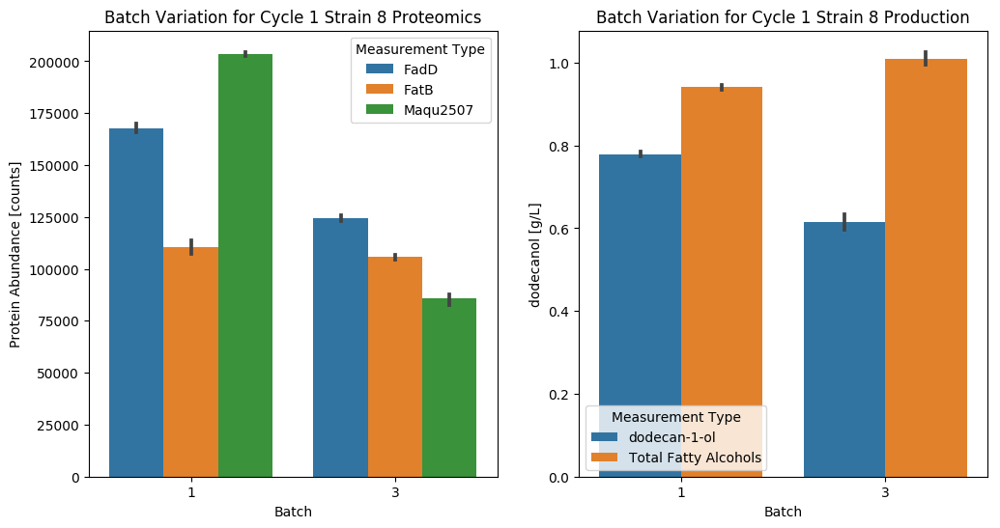

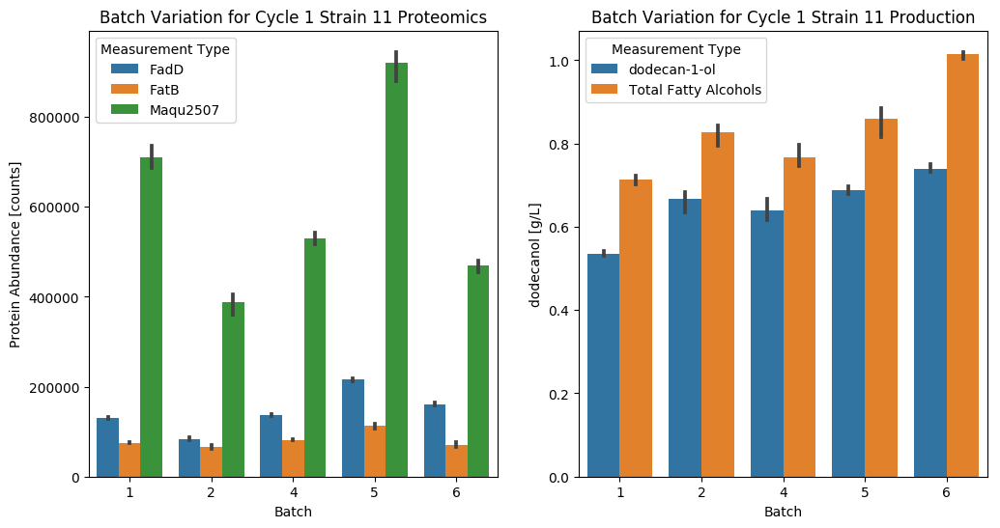

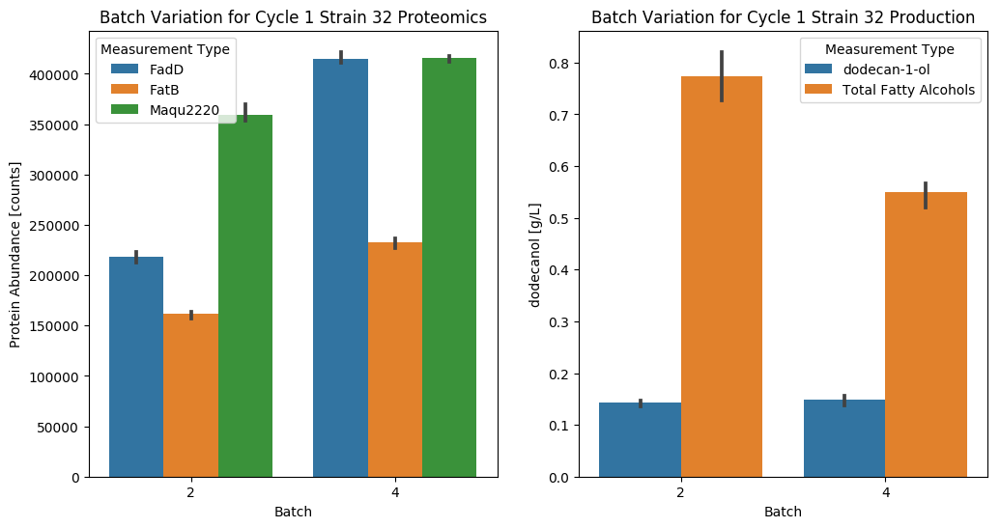

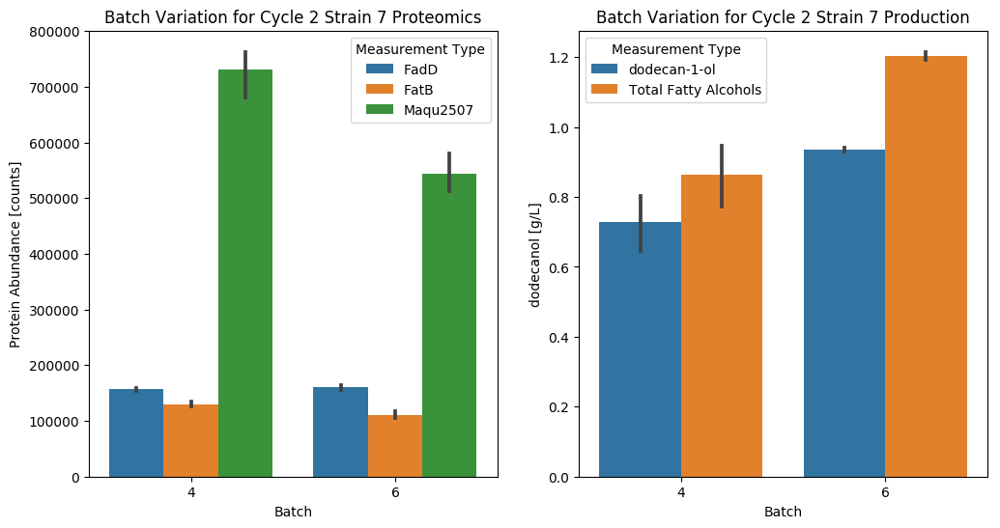

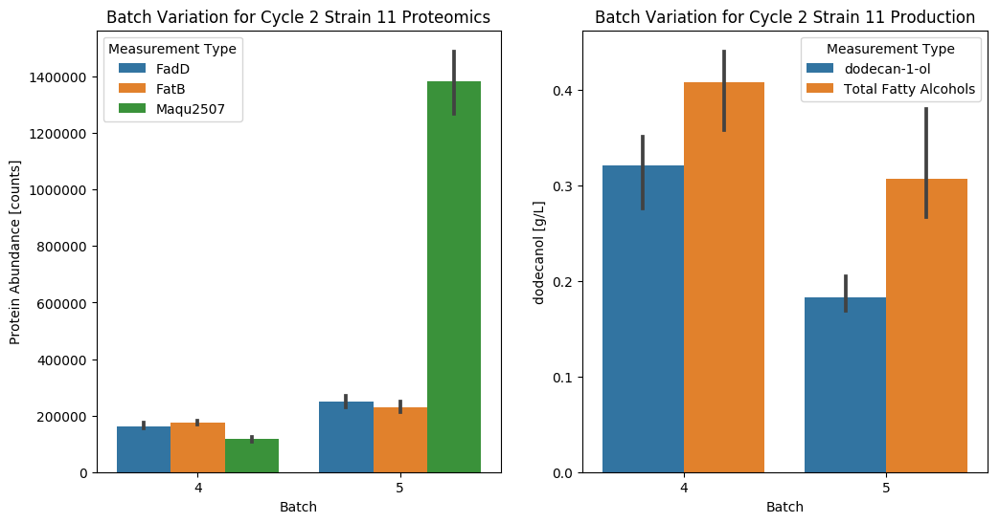

In [11]:
#Group Strains that are in multiple batches (Conditions Must be held constant)
conditions = [('Metadata','Cycle'),('Metadata','Strain'),('Metadata','IPTG')]
strain_groups = df.groupby(conditions)
for group in strain_groups:
    cycle,strain,iptg = group[0]
    strain_df = group[1]
    
    
    #Check to see if there are multiple batches in the strain
    if len(strain_df[('Metadata','Batch')].unique()) > 1:
        
        protein_columns = strain_df.columns[((strain_df>1e4)|strain_df.isnull()).all(axis=0) & (strain_df.columns.get_level_values(0)=='Targeted Proteomics')]
        strain_df = strain_df.dropna(subset=protein_columns)
        strain_df.loc[:,('Metadata','Batch')] = strain_df[('Metadata','Batch')].apply(lambda x: int(x))
        
        protein_df = strain_df[list(protein_columns)+[('Metadata','Batch')]].melt(id_vars=[('Metadata','Batch')],value_vars=list(protein_columns))
        protein_df = protein_df.replace(PROTEIN_NAMES)
        production_df = strain_df[[('GC-MS','Total Fatty Alcohols'),('GC-MS','dodecan-1-ol'),('Metadata','Batch')]].melt(id_vars=[('Metadata','Batch')],value_vars=[('GC-MS','dodecan-1-ol'),('GC-MS','Total Fatty Alcohols')])
        
        if len(protein_df) > 0:
            plt.figure(figsize=(12,6))
            
            #Protein Plot
            plt.subplot(1,2,1)
            sns.barplot(x=('Metadata','Batch'),y='value',hue='Measurement Type',data=protein_df)
            plt.title('Batch Variation for Cycle {} Strain {} Proteomics'.format(int(cycle),strain))
            plt.ylabel('Protein Abundance [counts]')
            plt.xlabel('Batch')

            #Production Plot
            plt.subplot(1,2,2)
            sns.barplot(x=('Metadata','Batch'),y='value',hue='Measurement Type',data=production_df)
            plt.title('Batch Variation for Cycle {} Strain {} Production'.format(int(cycle),strain))
            plt.ylabel('dodecanol [g/L]')
            plt.xlabel('Batch')
            
            plt.savefig('figures/BatchEffects_Cycle{}Strain{}'.format(int(cycle),strain),dpi=600)
            plt.show()
        

### 2. Engineering Accuracy
We analyze the success of the predictive tools in hitting target protein levels in different constructs.

Pathway 1, RBS Calculator: EMOPEC


/Users/zak/Documents/Projects/ajinomoto/utility.py:56: RuntimeWarning:

internal gelsd driver lwork query error, required iwork dimension not returned. This is likely the result of LAPACK bug 0038, fixed in LAPACK 3.2.2 (released July 21, 2010). Falling back to 'gelss' driver.



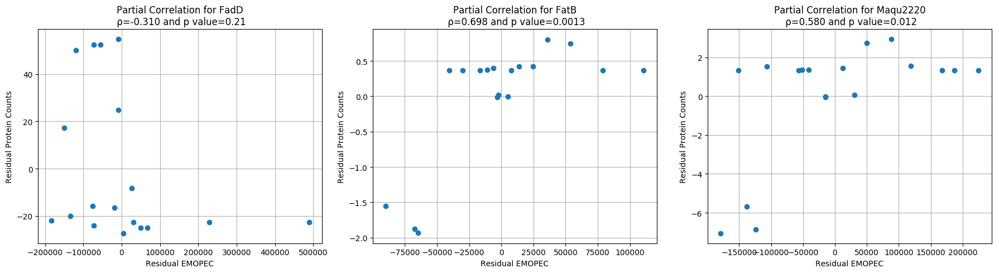

Pathway 1, RBS Calculator: TIR


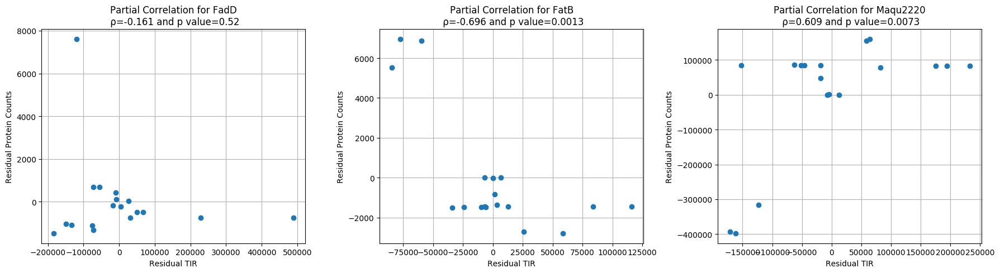

Pathway 2, RBS Calculator: EMOPEC


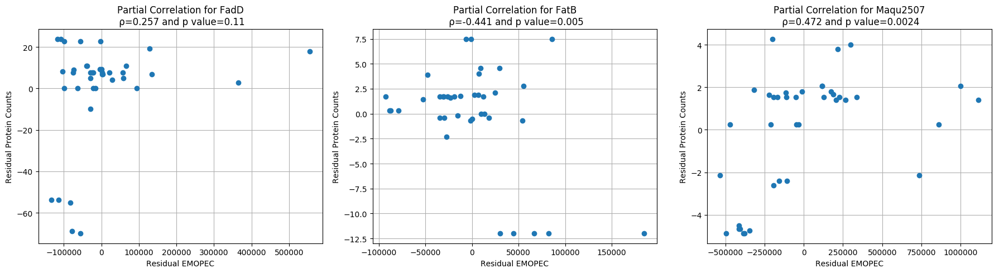

Pathway 2, RBS Calculator: TIR


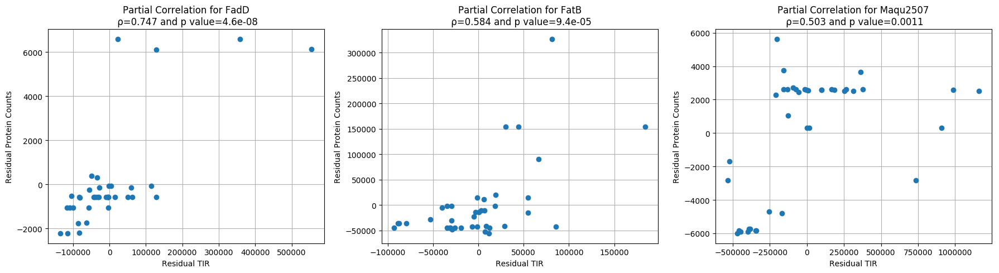

In [12]:
#Check to see if there are correlations between rbs and production after controlling for context (partial correlation)
from utility import partial_correlation

#First Check for Maqu2507 Strains look at each one controling for other TIRs/EMOPECs
for pathway in [1,2]:
    pathway_df = df.loc[df[('Metadata','Pathway')]==pathway]
    compare_columns = pathway_df.columns[pathway_df.columns.get_level_values(0).isin(['Targeted Proteomics','TIR','EMOPEC'])]
    grouping = [('Metadata','Cycle'),('Metadata','Strain'),('Metadata','IPTG'),('Metadata','Batch')]
    pathway_df = pathway_df.dropna(subset=compare_columns).groupby(grouping).mean()

    proteins = pathway_df.columns[((pathway_df>1e3)|pathway_df.isnull()).all(axis=0) & (pathway_df.columns.get_level_values(0)=='Targeted Proteomics')]

    #print(list(proteins))
    for rbs_calculator in ['EMOPEC','TIR']:
        print('Pathway {}, RBS Calculator: {}'.format(pathway,rbs_calculator))

        plt.figure(figsize=(18,5))
        for i,(data_type,protein) in enumerate(proteins):

            #Independent Variable
            X = pathway_df[data_type].loc[:,protein]
            
            #Dependent Variable
            Y = pathway_df[rbs_calculator].loc[:,protein]

            #Controlling Variables
            control_vars = [(rbs_calculator,p) for _,p in proteins if p != protein]
            control_vars.append(('Metadata','Copy Number'))
            Z = pathway_df.loc[:,control_vars]
            Z['Ones'] =  np.ones(len(X))

            #Perform partial_correlation
            corr,p_val,e_x,e_y = partial_correlation(X,Y,Z)

            #Plot Error residuals that form the correlation
            plt.subplot(1,3,i+1)
            plt.scatter(e_x,e_y)
            
            plt.gca().set_axisbelow(True)
            plt.grid()
            plt.xlabel('Residual {}'.format(rbs_calculator))
            plt.ylabel('Residual Protein Counts')
            plt.title('Partial Correlation for {}\n ρ={:0.3f} and p value={:0.2g}'.format(PROTEIN_NAMES[protein],corr,p_val))

        plt.tight_layout()
        plt.savefig('figures/engineering_pathway{}_{}.pdf'.format(pathway,rbs_calculator),dpi=600)
        plt.show()


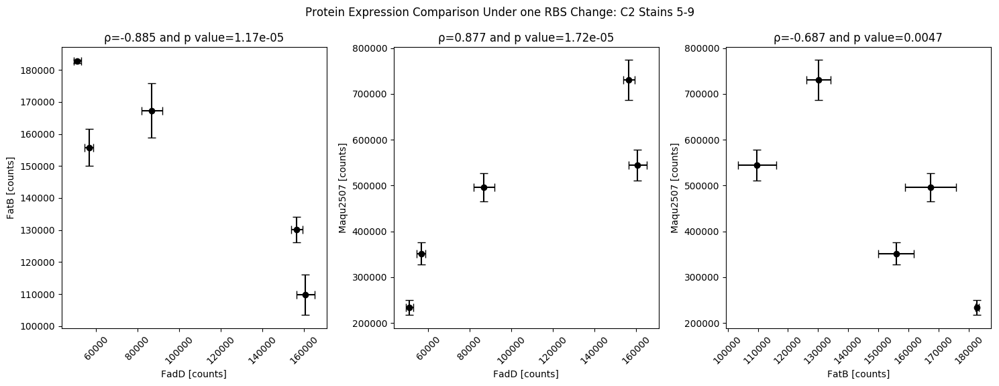

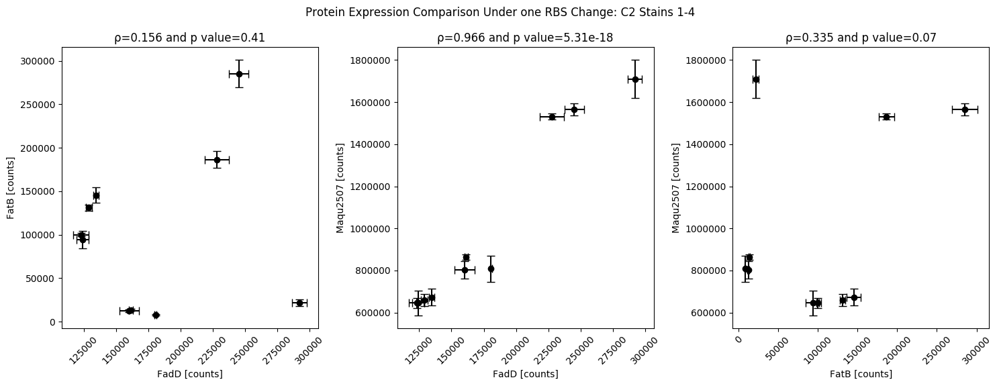

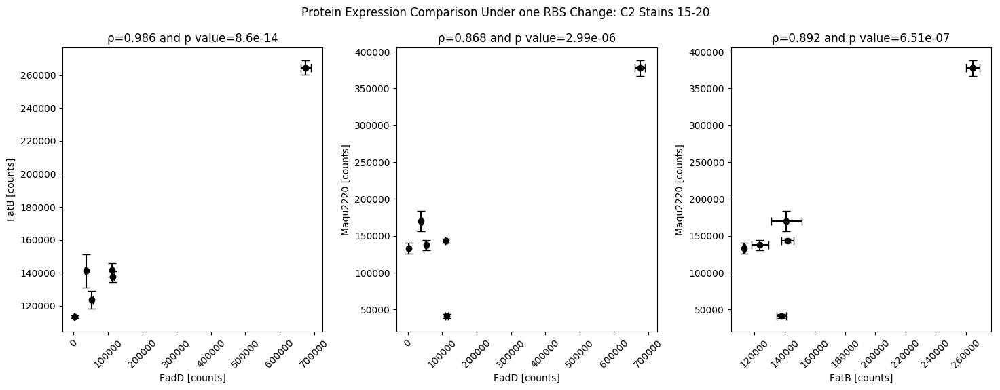

In [13]:
#Check the relationship between proteins modulated by strains and 

#Strain Comparison
strain_groups = ([5,6,7,8,9],[1,2,3,4],[15,16,17,18,19,20])
reductases = ['tr|A1U3L3|A1U3L3_MARHV','tr|A1U3L3|A1U3L3_MARHV','tr|A1U2T0|A1U2T0_MARHV']
group_criteria = [('Metadata','Strain'),('Metadata','Cycle'),('Metadata','Batch'),('Metadata','IPTG')]
for strains,reductase in zip(strain_groups,reductases):
    plot_df = df.loc[(df[('Metadata','Strain')].isin(strains))&(df[('Metadata','Cycle')]==2)]
    plot_df = plot_df.dropna(subset=df.columns[df.columns.get_level_values(0)=='Targeted Proteomics'])
    
    total_df = plot_df['Targeted Proteomics']
    mean_df = plot_df.groupby(group_criteria).mean()['Targeted Proteomics']
    std_df = plot_df.groupby(group_criteria).std()['Targeted Proteomics']

    #display(plot_df)
    fig = plt.figure(figsize=(15,6))
    for i,(p1,p2) in enumerate([('sp|P69451|LCFA_ECOLI','sp|Q41635|FATB_UMBCA'),('sp|P69451|LCFA_ECOLI',reductase),('sp|Q41635|FATB_UMBCA',reductase)]):
        plt.subplot(1,3,i+1)
        corr,pval = stats.pearsonr(total_df[p1], total_df[p2])
        #print('ρ={:0.3f} and p value={:0.2g}'.format(corr,pval))
        plt.errorbar(mean_df[p1],mean_df[p2],yerr=std_df[p2], xerr=std_df[p1],ls='none',fmt='ko', markersize=6, capsize=4)
        plt.xlabel('{} [counts]'.format(PROTEIN_NAMES[p1]))
        plt.ylabel('{} [counts]'.format(PROTEIN_NAMES[p2]))
        
        #ticks = ticker.FuncFormatter(lambda x, pos: '{0:0.1g}'.format(x))
        #plt.gca().xaxis.set_major_formatter(ticks)
        #plt.gca().yaxis.set_major_formatter(ticks)
        plt.xticks(rotation=45)

        
        plt.title('ρ={:0.3f} and p value={:0.3g}'.format(corr,pval))
        
    st = fig.suptitle('Protein Expression Comparison Under one RBS Change: C2 Stains {}-{}'.format(min(strains),max(strains)))
    
    plt.tight_layout()
    st.set_y(0.95)
    fig.subplots_adjust(top=0.85)
    plt.savefig('figures/polarity_analysis_strains{}-{}.pdf'.format(min(strains),max(strains)),dpi=600)
    plt.show()


### 3. Model Predictions and Accuracy
Here we use the Automated Reccomendation tool to predict Production in the next round.

In [14]:
#Setup ART Parameters
from rectool.rt import recommendation_engine

art_params = {}
art_params['data_file'] = 'tmp/generated_data.csv' #Data File From EDD -- Going to Need Strain Information from ICE too...

#Set as dodecanol c12 fatty alcohol
art_params['objective_dict'] = {'objective':'maximize','threshold':0.20}
art_params['num_strains'] = 0
art_params['engineering_accuracy'] = 0.5
art_params['verbose'] = 2
art_params['tpot_dict'] = {'generations':20,'population_size':100}
#art_params['tpot_dict'] = {'generations':20,'population_size':20}
art_params['tpot_dict'] = {'generations':5,'population_size':20}

art_params['extrapolation_constant'] = 1.5
art_params['seed'] = 8311

def edd_csv(df,columns):
    edd_df = pd.melt(df.reset_index(),id_vars=[('Line Name','')], value_vars=columns)
    edd_df.columns = ['Line Name','Protocol Name','Measurement Type',0.0]
    edd_df = edd_df[['Line Name','Protocol Name','Measurement Type',0.0]]
    edd_df.set_index('Line Name').to_csv('tmp/generated_data.csv')


/usr/local/lib/python3.7/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning:

numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.



First ART is applied to creating models of production from pathway protein concentrations.  Those Models are then used to predict Cycle 2 Strain Performance.

In [15]:
#Set as proteins only for now... (make sure art is doing the right thing with this data)
from utility import make_predictions

AJINOMOTO_STRAINS = (df[('Metadata','Pathway')] > 0) & (df[('Metadata','Pathway')] < 3)
CYCLE_1 = (df[('Metadata','Cycle')] == 1) & (df[('Metadata','Batch')] < 4)
CYCLE_2 = (df[('Metadata','Cycle')] == 2) & (df[('Metadata','Batch')] > 3)

art_df = df.loc[CYCLE_1 & AJINOMOTO_STRAINS].groupby([('Metadata','Strain'),('Metadata','Batch')]).mean()
art_df['Line Name'] = np.arange(0,len(art_df))
display(art_df)

art_groups = art_df.groupby([('Metadata','Pathway')])
scores = np.zeros((4,2))
for i,group in enumerate(art_groups):
    group_df = group[1]
    display(group_df)
    pathway = group[0]
    feature_columns = list(group_df['Targeted Proteomics'].loc[:,group_df['TIR'].all(axis=0) > 0].columns)
    target_column = 'dodecan-1-ol'
    
    #Create dataframe and save out    
    columns =  [('Targeted Proteomics',feature) for feature in feature_columns] + [('GC-MS','dodecan-1-ol')]
    group_df = group_df.dropna(subset=columns)
    display(group_df)
    edd_csv(group_df,columns)

    #set features and target for simulation
    art_params['target'] = ['dodecan-1-ol'] # Maybe use Growth Rate Instead??
    art_params['features']  = feature_columns
    
    #Run ART
    art = recommendation_engine(**art_params)
    display(art.model_df)
    scores[:,pathway-1] =  art.model_df['MSE']
    #if i == 0:
    #    scores_2220 = scores
    
    #Create Cycle 2 Predictions from Models
    if ~(df.columns.get_level_values(0) == 'Prediction').any():
        df = df.join(pd.DataFrame(float('NaN'),columns=pd.MultiIndex.from_product([['Prediction'], art.model_df.index]), index=df.index))

    cycle2_pathway_proteins = CYCLE_2 & (df[('Metadata','Pathway')] == pathway) & ~pd.isnull(df['Targeted Proteomics']).any(axis=1)
    df.loc[cycle2_pathway_proteins, df.columns.get_level_values(0)=='Prediction'] = make_predictions(df.loc[cycle2_pathway_proteins],art.model_df,columns[0:3])



Protocol Name                                     EMOPEC                       \
Measurement Type                     sp|P27250|AHR_ECOLI sp|P69451|LCFA_ECOLI   
(Metadata, Strain) (Metadata, Batch)                                            
1                  1.0                               0.0                 14.8   
                   3.0                               0.0                 14.8   
2                  1.0                               0.0                 92.4   
                   3.0                               0.0                 92.4   
3                  3.0                               0.0                 87.6   
4                  1.0                               0.0                 14.8   
5                  3.0                               0.0                 92.4   
6                  3.0                               0.0                 87.6   
7                  3.0                               0.0                 14.8   
8                  1.0                               0.0                 92.4   
                   3.0                               0.0                 92.4   
9                  1.0                               0.0                 87.6   
10                 3.0                               0.0                 14.8   
11                 1.0                               0.0                 92.4   
                   2.0                               0.0                 92.4   
12                 1.0                               0.0                 87.6   
13                 3.0                               0.0                 14.8   
15                 1.0                               0.0                 14.8   
16                 1.0                               0.0                 92.4   
                   3.0                               0.0                 92.4   
18                 3.0                               0.0                 14.8   
19                 2.0                               0.0                 92.4   
31                 2.0                               0.0                 92.4   
32                 2.0                               0.0                 14.8   
33                 2.0                               0.0                 92.4   
34                 2.0                               0.0                 87.6   

Protocol Name                                              \
Measurement Type                     sp|Q41635|FATB_UMBCA   
(Metadata, Strain) (Metadata, Batch)                        
1                  1.0                               96.5   
                   3.0                               96.5   
2                  1.0                               96.5   
                   3.0                               96.5   
3                  3.0                               96.5   
4                  1.0                               96.5   
5                  3.0                               96.5   
6                  3.0                               96.5   
7                  3.0                               94.2   
8                  1.0                               94.2   
                   3.0                               94.2   
9                  1.0                               94.2   
10                 3.0                               94.2   
11                 1.0                               94.2   
                   2.0                               94.2   
12                 1.0                               94.2   
13                 3.0                               96.5   
15                 1.0                               94.2   
16                 1.0                               94.2   
                   3.0                               94.2   
18                 3.0                               94.2   
19                 2.0                               94.2   
31                 2.0                               96.5   
32                 2.0                               96.5   
33 

Protocol Name                                     EMOPEC                       \
Measurement Type                     sp|P27250|AHR_ECOLI sp|P69451|LCFA_ECOLI   
(Metadata, Strain) (Metadata, Batch)                                            
13                 3.0                               0.0                 14.8   
15                 1.0                               0.0                 14.8   
16                 1.0                               0.0                 92.4   
                   3.0                               0.0                 92.4   
18                 3.0                               0.0                 14.8   
19                 2.0                               0.0                 92.4   
31                 2.0                               0.0                 92.4   
32                 2.0                               0.0                 14.8   
33                 2.0                               0.0                 92.4   
34                 2.0                               0.0                 87.6   

Protocol Name                                              \
Measurement Type                     sp|Q41635|FATB_UMBCA   
(Metadata, Strain) (Metadata, Batch)                        
13                 3.0                               96.5   
15                 1.0                               94.2   
16                 1.0                               94.2   
                   3.0                               94.2   
18                 3.0                               94.2   
19                 2.0                               94.2   
31                 2.0                               96.5   
32                 2.0                               96.5   
33                 2.0                               96.5   
34                 2.0                               96.5   

Protocol Name                                              \
Measurement Type                     sp|Q6F7B8|ACR1_ACIAD   
(Metadata, Strain) (Metadata, Batch)                        
13                 3.0                                0.0   
15                 1.0                                0.0   
16                 1.0                                0.0   
                   3.0                                0.0   
18                 3.0                                0.0   
19                 2.0                                0.0   
31                 2.0                                0.0   
32                 2.0                                0.0   
33                 2.0                                0.0   
34                 2.0                                0.0   

Protocol Name                                                \
Measurement Type                     tr|A1U2T0|A1U2T0_MARHV   
(Metadata, Strain) (Metadata, Batch)                          
13                 3.0                                 72.1   
15                 1.0                                 72.1   
16                 1.0                                 72.1   
                   3.0                                 72.1   
18                 3.0                                 80.5   
19                 2.0                                 80.5   
31                 2.0                                 72.1   
32                 2.0                                 80.5   
33                 2.0                                 80.5   
34                 2.0                                 80.5   

Protocol Name                                                      GC-MS  \
Measurement Type                     tr|A1U3L3|A1U3L3_MARHV dodecan-1-ol   
(Metadata, Strain) (Metadata, Batch)                                       
13                 3.0                                  0.0     0.026020   
15                 1.0                                  0.0     0.000000   
16                 1.0                                  0.0     0.000000   
                   3.0                                  0.0     0.021817   
18    

Protocol Name                                     EMOPEC                       \
Measurement Type                     sp|P27250|AHR_ECOLI sp|P69451|LCFA_ECOLI   
(Metadata, Strain) (Metadata, Batch)                                            
13                 3.0                               0.0                 14.8   
15                 1.0                               0.0                 14.8   
18                 3.0                               0.0                 14.8   
19                 2.0                               0.0                 92.4   
31                 2.0                               0.0                 92.4   
32                 2.0                               0.0                 14.8   
33                 2.0                               0.0                 92.4   
34                 2.0                               0.0                 87.6   

Protocol Name                                              \
Measurement Type                     sp|Q41635|FATB_UMBCA   
(Metadata, Strain) (Metadata, Batch)                        
13                 3.0                               96.5   
15                 1.0                               94.2   
18                 3.0                               94.2   
19                 2.0                               94.2   
31                 2.0                               96.5   
32                 2.0                               96.5   
33                 2.0                               96.5   
34                 2.0                               96.5   

Protocol Name                                              \
Measurement Type                     sp|Q6F7B8|ACR1_ACIAD   
(Metadata, Strain) (Metadata, Batch)                        
13                 3.0                                0.0   
15                 1.0                                0.0   
18                 3.0                                0.0   
19                 2.0                                0.0   
31                 2.0                                0.0   
32                 2.0                                0.0   
33                 2.0                                0.0   
34                 2.0                                0.0   

Protocol Name                                                \
Measurement Type                     tr|A1U2T0|A1U2T0_MARHV   
(Metadata, Strain) (Metadata, Batch)                          
13                 3.0                                 72.1   
15                 1.0                                 72.1   
18                 3.0                                 80.5   
19                 2.0                                 80.5   
31                 2.0                                 72.1   
32                 2.0                                 80.5   
33                 2.0                                 80.5   
34                 2.0                                 80.5   

Protocol Name                                                      GC-MS  \
Measurement Type                     tr|A1U3L3|A1U3L3_MARHV dodecan-1-ol   
(Metadata, Strain) (Metadata, Batch)                                       
13                 3.0                                  0.0     0.026020   
15                 1.0                                  0.0     0.000000   
18                 3.0                                  0.0     0.153923   
19                 2.0                                  0.0     0.145433   
31                 2.0                                  0.0     0.000000   
32                 2.0                                  0.0     0.142310   
33                 2.0                                  0.0     0.113867   
34                 2.0                                  0.0     0.000000   

Protocol Name                                                       \
Measurement Type                     hexadecan-1-ol octadecan-1-ol   
(Metadata, Strain) (Metadata, Batch)                                 
13                 3.0 

Independent Variables                                              \
           sp|P69451|LCFA_ECOLI sp|Q41635|FATB_UMBCA tr|A1U2T0|A1U2T0_MARHV   
Line Name                                                                     
16                201285.333333        215126.333333           11883.000000   
17                202178.000000         71856.500000            9405.000000   
20                300955.333333         89131.000000          197144.000000   
21                160107.333333         73398.333333          171616.333333   
22                 95701.333333        184578.333333            2726.666667   
23                217968.333333        161438.333333          358829.666667   
24                177766.666667        154524.000000          245649.666667   
25                 67138.666667        166209.333333           24703.000000   

          Dependent Variable  
                dodecan-1-ol  
Line Name                     
16                  0.026020  
17                  0.000000  
20                  0.153923  
21                  0.145433  
22                  0.000000  
23                  0.142310  
24                  0.113867  
25                  0.000000

Optimization Progress:  33%|███▎      | 40/120 [00:09<00:23,  3.37pipeline/s]

Generation 1 - Current best internal CV score: -0.0026591599147240985


Optimization Progress:  50%|█████     | 60/120 [00:13<00:09,  6.63pipeline/s]

Generation 2 - Current best internal CV score: -0.0026591599147240985


Optimization Progress:  67%|██████▋   | 80/120 [00:15<00:03, 12.25pipeline/s]

Generation 3 - Current best internal CV score: -0.002416420656791884


Optimization Progress:  83%|████████▎ | 100/120 [00:18<00:03,  5.71pipeline/s]

Generation 4 - Current best internal CV score: -0.002412267926286033


Generation 5 - Current best internal CV score: -0.002412267926286033

Best pipeline: RidgeCV(ElasticNetCV(MinMaxScaler(DecisionTreeRegressor(input_matrix, max_depth=9, min_samples_leaf=14, min_samples_split=2)), l1_ratio=0.6000000000000001, tol=1e-05))


,Model
Name,
Random Forest Regressor,"(DecisionTreeRegressor(criterion='mse', max_de..."
Polynomial Regressor,"Pipeline(memory=None,\n steps=[('Scaler', ..."
Neural Regressor,"Pipeline(memory=None,\n steps=[('Scaling',..."
TPOT Regressor,"Pipeline(memory=None,\n steps=[('stackinge..."


,Model,Predictions,Error Mean,Error Standard Deviation,MSE
Name,,,,,
Random Forest Regressor,"(DecisionTreeRegressor(criterion='mse', max_de...","[0.051235333333333334, 0.12880666666666668, 0....",-0.013143,0.057441,0.003472
Polynomial Regressor,"Pipeline(memory=None,\n steps=[('Scaler', ...","[0.04308858002939438, 0.14289316387849035, 0.0...",-0.015412,0.066771,0.004696
Neural Regressor,"Pipeline(memory=None,\n steps=[('Scaling',...","[0.14910275606722784, 0.06411423805384558, 1.1...",-0.190149,0.324155,0.141233
TPOT Regressor,"Pipeline(memory=None,\n steps=[('stackinge...","[0.00561331374119084, 0.09873631192037041, 0.0...",0.003493,0.056870,0.003246


,sp|P69451|LCFA_ECOLI,sp|Q41635|FATB_UMBCA,tr|A1U2T0|A1U2T0_MARHV,Success Probability,Random Forest Regressor,Polynomial Regressor,Neural Regressor,TPOT Regressor


,Model,Predictions,Error Mean,Error Standard Deviation,MSE,Target Interval,Success Probability
Name,,,,,,,
Random Forest Regressor,"(DecisionTreeRegressor(criterion='mse', max_de...","[0.051235333333333334, 0.12880666666666668, 0....",-0.013143,0.057441,0.003472,"[0.14305266666666666, inf]",<function recommendation_engine.optimal_state....
Polynomial Regressor,"Pipeline(memory=None,\n steps=[('Scaler', ...","[0.04308858002939438, 0.14289316387849035, 0.0...",-0.015412,0.066771,0.004696,"[[0.18470799999999998], inf]",<function recommendation_engine.optimal_state....
Neural Regressor,"Pipeline(memory=None,\n steps=[('Scaling',...","[0.14910275606722784, 0.06411423805384558, 1.1...",-0.190149,0.324155,0.141233,"[[0.18470799999999998], inf]",<function recommendation_engine.optimal_state....
TPOT Regressor,"Pipeline(memory=None,\n steps=[('stackinge...","[0.00561331374119084, 0.09873631192037041, 0.0...",0.003493,0.056870,0.003246,"[[0.18470799999999998], inf]",<function recommendation_engine.optimal_state....


Protocol Name                                     EMOPEC                       \
Measurement Type                     sp|P27250|AHR_ECOLI sp|P69451|LCFA_ECOLI   
(Metadata, Strain) (Metadata, Batch)                                            
1                  1.0                               0.0                 14.8   
                   3.0                               0.0                 14.8   
2                  1.0                               0.0                 92.4   
                   3.0                               0.0                 92.4   
3                  3.0                               0.0                 87.6   
4                  1.0                               0.0                 14.8   
5                  3.0                               0.0                 92.4   
6                  3.0                               0.0                 87.6   
7                  3.0                               0.0                 14.8   
8                  1.0                               0.0                 92.4   
                   3.0                               0.0                 92.4   
9                  1.0                               0.0                 87.6   
10                 3.0                               0.0                 14.8   
11                 1.0                               0.0                 92.4   
                   2.0                               0.0                 92.4   
12                 1.0                               0.0                 87.6   

Protocol Name                                              \
Measurement Type                     sp|Q41635|FATB_UMBCA   
(Metadata, Strain) (Metadata, Batch)                        
1                  1.0                               96.5   
                   3.0                               96.5   
2                  1.0                               96.5   
                   3.0                               96.5   
3                  3.0                               96.5   
4                  1.0                               96.5   
5                  3.0                               96.5   
6                  3.0                               96.5   
7                  3.0                               94.2   
8                  1.0                               94.2   
                   3.0                               94.2   
9                  1.0                               94.2   
10                 3.0                               94.2   
11                 1.0                               94.2   
                   2.0                               94.2   
12                 1.0                               94.2   

Protocol Name                                              \
Measurement Type                     sp|Q6F7B8|ACR1_ACIAD   
(Metadata, Strain) (Metadata, Batch)                        
1                  1.0                                0.0   
                   3.0                                0.0   
2                  1.0                                0.0   
                   3.0                                0.0   
3                  3.0                                0.0   
4                  1.0                                0.0   
5                  3.0                                0.0   
6                  3.0                                0.0   
7                  3.0                                0.0   
8                  1.0                                0.0   
                   3.0                                0.0   
9                  1.0                                0.0   
10                 3.0                                0.0   
11                 1.0                                0.0   
                   2.0                                0.0   
12                 1.0                                0.0   

Protocol Name                                                \
Measurement Type                     tr|A1U2T0|A1U2T0_MARHV   
(Metadata, Str

Protocol Name                                     EMOPEC                       \
Measurement Type                     sp|P27250|AHR_ECOLI sp|P69451|LCFA_ECOLI   
(Metadata, Strain) (Metadata, Batch)                                            
1                  1.0                               0.0                 14.8   
                   3.0                               0.0                 14.8   
2                  1.0                               0.0                 92.4   
                   3.0                               0.0                 92.4   
3                  3.0                               0.0                 87.6   
4                  1.0                               0.0                 14.8   
5                  3.0                               0.0                 92.4   
6                  3.0                               0.0                 87.6   
7                  3.0                               0.0                 14.8   
8                  1.0                               0.0                 92.4   
                   3.0                               0.0                 92.4   
9                  1.0                               0.0                 87.6   
10                 3.0                               0.0                 14.8   
11                 1.0                               0.0                 92.4   
                   2.0                               0.0                 92.4   
12                 1.0                               0.0                 87.6   

Protocol Name                                              \
Measurement Type                     sp|Q41635|FATB_UMBCA   
(Metadata, Strain) (Metadata, Batch)                        
1                  1.0                               96.5   
                   3.0                               96.5   
2                  1.0                               96.5   
                   3.0                               96.5   
3                  3.0                               96.5   
4                  1.0                               96.5   
5                  3.0                               96.5   
6                  3.0                               96.5   
7                  3.0                               94.2   
8                  1.0                               94.2   
                   3.0                               94.2   
9                  1.0                               94.2   
10                 3.0                               94.2   
11                 1.0                               94.2   
                   2.0                               94.2   
12                 1.0                               94.2   

Protocol Name                                              \
Measurement Type                     sp|Q6F7B8|ACR1_ACIAD   
(Metadata, Strain) (Metadata, Batch)                        
1                  1.0                                0.0   
                   3.0                                0.0   
2                  1.0                                0.0   
                   3.0                                0.0   
3                  3.0                                0.0   
4                  1.0                                0.0   
5                  3.0                                0.0   
6                  3.0                                0.0   
7                  3.0                                0.0   
8                  1.0                                0.0   
                   3.0                                0.0   
9                  1.0                                0.0   
10                 3.0                                0.0   
11                 1.0                                0.0   
                   2.0                                0.0   
12                 1.0                                0.0   

Protocol Name                                                \
Measurement Type                     tr|A1U2T0|A1U2T0_MARHV   
(Metadata, Str

Independent Variables                                              \
           sp|P69451|LCFA_ECOLI sp|Q41635|FATB_UMBCA tr|A1U3L3|A1U3L3_MARHV   
Line Name                                                                     
0                 110444.500000        143548.500000          166154.500000   
1                  91169.333333        140106.000000          116304.333333   
2                 108696.000000        142764.000000          156814.500000   
3                 116317.666667        146775.000000          148130.666667   
4                 353878.333333        127283.666667          131395.333333   
5                  81778.000000        115678.500000          572420.000000   
6                  85735.333333        108267.000000          447718.000000   
7                 189362.666667         52228.666667          226779.000000   
8                 141415.666667        102929.333333          100497.666667   
9                 167796.500000        110641.000000          203614.000000   
10                124498.333333        105648.666667           85989.000000   
11                778324.500000        139714.000000          219927.000000   
12                103107.333333         75355.666667          511713.666667   
13                129434.500000         74851.500000          711228.500000   
14                 83471.000000         66337.666667          388435.666667   
15                523699.500000         76936.500000          751750.000000   

          Dependent Variable  
                dodecan-1-ol  
Line Name                     
0                   0.689090  
1                   0.633920  
2                   0.568620  
3                   0.632163  
4                   0.168947  
5                   0.468715  
6                   0.539463  
7                   0.081380  
8                   0.560063  
9                   0.779450  
10                  0.614260  
11                  0.488260  
12                  0.646980  
13                  0.536025  
14                  0.666630  
15                  0.200305

Optimization Progress:  33%|███▎      | 40/120 [00:09<00:23,  3.45pipeline/s]

Generation 1 - Current best internal CV score: -0.030862256601581213


Optimization Progress:  50%|█████     | 60/120 [00:17<00:24,  2.47pipeline/s]

Generation 2 - Current best internal CV score: -0.030862256601581213


Optimization Progress:  67%|██████▋   | 80/120 [00:26<00:14,  2.71pipeline/s]

Generation 3 - Current best internal CV score: -0.030862256601581213


Optimization Progress:  83%|████████▎ | 100/120 [00:35<00:08,  2.32pipeline/s]

Generation 4 - Current best internal CV score: -0.030862256601581213


Generation 5 - Current best internal CV score: -0.029768718701166052

Best pipeline: DecisionTreeRegressor(ElasticNetCV(PCA(input_matrix, iterated_power=7, svd_solver=randomized), l1_ratio=0.05, tol=0.001), max_depth=4, min_samples_leaf=4, min_samples_split=12)


,Model
Name,
Random Forest Regressor,"(DecisionTreeRegressor(criterion='mse', max_de..."
Polynomial Regressor,"Pipeline(memory=None,\n steps=[('Scaler', ..."
Neural Regressor,"Pipeline(memory=None,\n steps=[('Scaling',..."
TPOT Regressor,"Pipeline(memory=None,\n steps=[('pca', PCA..."


,Model,Predictions,Error Mean,Error Standard Deviation,MSE
Name,,,,,
Random Forest Regressor,"(DecisionTreeRegressor(criterion='mse', max_de...","[0.5813286666666667, 0.5863131666666666, 0.690...",-0.024413,0.212675,0.045827
Polynomial Regressor,"Pipeline(memory=None,\n steps=[('Scaler', ...","[0.5955798428128787, 0.6095269796264627, 0.643...",0.037656,0.291607,0.086453
Neural Regressor,"Pipeline(memory=None,\n steps=[('Scaling',...","[0.5831462946216097, 0.6797810605206929, 0.620...",-0.116816,0.331539,0.123564
TPOT Regressor,"Pipeline(memory=None,\n steps=[('pca', PCA...","[0.601237, 0.601237, 0.6134596666666666, 0.613...",0.004022,0.188410,0.035515


,sp|P69451|LCFA_ECOLI,sp|Q41635|FATB_UMBCA,tr|A1U3L3|A1U3L3_MARHV,Success Probability,Random Forest Regressor,Polynomial Regressor,Neural Regressor,TPOT Regressor


,Model,Predictions,Error Mean,Error Standard Deviation,MSE,Target Interval,Success Probability
Name,,,,,,,
Random Forest Regressor,"(DecisionTreeRegressor(criterion='mse', max_de...","[0.5813286666666667, 0.5863131666666666, 0.690...",-0.024413,0.212675,0.045827,"[0.7403788333333332, inf]",<function recommendation_engine.optimal_state....
Polynomial Regressor,"Pipeline(memory=None,\n steps=[('Scaler', ...","[0.5955798428128787, 0.6095269796264627, 0.643...",0.037656,0.291607,0.086453,"[[0.93534], inf]",<function recommendation_engine.optimal_state....
Neural Regressor,"Pipeline(memory=None,\n steps=[('Scaling',...","[0.5831462946216097, 0.6797810605206929, 0.620...",-0.116816,0.331539,0.123564,"[[0.93534], inf]",<function recommendation_engine.optimal_state....
TPOT Regressor,"Pipeline(memory=None,\n steps=[('pca', PCA...","[0.601237, 0.601237, 0.6134596666666666, 0.613...",0.004022,0.188410,0.035515,"[0.6430245833333332, inf]",<function recommendation_engine.optimal_state....


In [16]:
CYCLE_2 = (df[('Metadata','Cycle')] == 2) & (df[('Metadata','Batch')] > 3)
cycle2_pathway_proteins = CYCLE_2 & (df[('Metadata','Pathway')] == 2) & ~pd.isnull(df['Targeted Proteomics']).any(axis=1)
criteria = [('Metadata','Cycle'),('Metadata','Strain'),('Metadata','IPTG'),('Metadata','Batch')]
display(df.loc[cycle2_pathway_proteins].groupby(criteria).mean())

#print(pathway)
#pathway = 2
#display(df.loc[df[('Metadata','Pathway')]==pathway,:].groupby(criteria).mean().dropna(subset=[('GC-MS','Total Fatty Alcohols'),('Targeted Proteomics','tr|A1U2T0|A1U2T0_MARHV')]))

Protocol Name                                                                        EMOPEC  \
Measurement Type                                                        sp|P27250|AHR_ECOLI   
(Metadata, Cycle) (Metadata, Strain) (Metadata, IPTG) (Metadata, Batch)                       
2.0               1                  0.1              5.0                               0.0   
                                     0.5              6.0                               0.0   
                                     1.0              6.0                               0.0   
                  2                  0.1              5.0                               0.0   
                                     0.5              6.0                               0.0   
                                     1.0              6.0                               0.0   
                  3                  0.1              6.0                               0.0   
                  4                  0.1              5.0                               0.0   
                                     0.5              6.0                               0.0   
                                     1.0              6.0                               0.0   
                  5                  0.1              4.0                               0.0   
                  7                  0.1              4.0                               0.0   
                                                      6.0                               0.0   
                  8                  0.1              4.0                               0.0   
                  9                  0.1              6.0                               0.0   
                  10                 0.1              4.0                               0.0   
                  11                 0.1              4.0                               0.0   
                                                      5.0                               0.0   
                  14                 0.1              5.0                               0.0   

Protocol Name                                                                                 \
Measurement Type                                                        sp|P69451|LCFA_ECOLI   
(Metadata, Cycle) (Metadata, Strain) (Metadata, IPTG) (Metadata, Batch)                        
2.0               1                  0.1              5.0                               92.4   
                                     0.5              6.0                               92.4   
                                     1.0              6.0                               92.4   
                  2                  0.1              5.0                               92.4   
                                     0.5              6.0                               92.4   
                                     1.0              6.0                               92.4   
                  3                  0.1              6.0                               92.4   
                  4                  0.1              5.0                               92.4   
                                     0.5              6.0                               92.4   
                                     1.0              6.0                               92.4   
                  5                  0.1              4.0                               92.4   
                  7                  0.1              4.0                               92.4   
                                                      6.0                               92.4   
                  8                  0.1              4.0                               92.4   
                  9                  0.1              6.0                               92.4   
                  10                 0.1              4.0                               92.4   
                  11                 0.1              4.0                            

In [17]:
#Build and Plot Aggregate Model!
def softmax(x):
    '''compute the softmax function of a vector.'''
    return np.exp(x) / sum(np.exp(x))


#Compute Aggregate Predictions Based on Weights
columns = df.columns[df.columns.get_level_values(0)=='Prediction']
print(list(columns))
for pathway in [1,2]:
    #display(df.loc[df[('Metadata','Pathway')]==pathway]['Prediction'])
    print(softmax(-10*scores[:,pathway-1]))
    df[('Prediction','Aggregate')] = df.loc[df[('Metadata','Pathway')]==pathway,df.columns.isin(columns)].apply(lambda x: sum(x*softmax(-10*scores[:,pathway-1])),axis=1)

[('Prediction', 'Random Forest Regressor'), ('Prediction', 'Polynomial Regressor'), ('Prediction', 'Neural Regressor'), ('Prediction', 'TPOT Regressor')]
[0.3084251  0.30467389 0.07777872 0.3091223 ]
[0.30917879 0.20595506 0.14210252 0.34276362]


Protocol Name                      EMOPEC                       \
Measurement Type      sp|P27250|AHR_ECOLI sp|P69451|LCFA_ECOLI   
Line Name                                                        
C2-S10-B2.3-R1                        0.0              92400.0   
C2-S10-B2.3-R2                        0.0              92400.0   
C2-S10-B2.3-R3                        0.0              92400.0   
C2-S11-B2.3-R1                        0.0              92400.0   
C2-S11-B2.3-R2                        0.0              92400.0   
C2-S11-B2.3-R3                        0.0              92400.0   
C2-S5-B2.3-R1                         0.0              92400.0   
C2-S5-B2.3-R2                         0.0              92400.0   
C2-S5-B2.3-R3                         0.0              92400.0   
C2-S7-B2.3-R1                         0.0              92400.0   
C2-S7-B2.3-R2                         0.0              92400.0   
C2-S7-B2.3-R3                         0.0              92400.0   
C2-S8-B2.3-R1                         0.0              92400.0   
C2-S8-B2.3-R2                         0.0              92400.0   
C2-S8-B2.3-R3                         0.0              92400.0   
C2-S1-B2.4-R1                         0.0              92400.0   
C2-S1-B2.4-R2                         0.0              92400.0   
C2-S1-B2.4-R3                         0.0              92400.0   
C2-S2-B2.4-R1                         0.0              92400.0   
C2-S2-B2.4-R2                         0.0              92400.0   
C2-S2-B2.4-R3                         0.0              92400.0   
C2-S4-B2.4-R1                         0.0              92400.0   
C2-S4-B2.4-R2                         0.0              92400.0   
C2-S4-B2.4-R3                         0.0              92400.0   
C2-S11-B2.4-R1                        0.0              92400.0   
C2-S11-B2.4-R2                        0.0              92400.0   
C2-S11-B2.4-R3                        0.0              92400.0   
C2-S14-B2.4-R1                        0.0              92400.0   
C2-S14-B2.4-R2                        0.0              92400.0   
C2-S14-B2.4-R3                        0.0              92400.0   
C2-S1-B2.5-R1-IPTG0.5                 0.0              92400.0   
C2-S1-B2.5-R2-IPTG0.5                 0.0              92400.0   
C2-S1-B2.5-R3-IPTG0.5                 0.0              92400.0   
C2-S1-B2.5-R1-IPTG1.0                 0.0              92400.0   
C2-S1-B2.5-R2-IPTG1.0                 0.0              92400.0   
C2-S1-B2.5-R3-IPTG1.0                 0.0              92400.0   
C2-S2-B2.5-R1-IPTG0.5                 0.0              92400.0   
C2-S2-B2.5-R2-IPTG0.5                 0.0              92400.0   
C2-S2-B2.5-R3-IPTG0.5                 0.0              92400.0   
C2-S2-B2.5-R1-IPTG1.0                 0.0              92400.0   
C2-S2-B2.5-R2-IPTG1.0                 0.0              92400.0   
C2-S2-B2.5-R3-IPTG1.0                 0.0              92400.0   
C2-S3-B2.5-R1                         0.0              92400.0   
C2-S3-B2.5-R2                         0.0              92400.0   
C2-S3-B2.5-R3                         0.0              92400.0   
C2-S4-B2.5-R1-IPTG0.5                 0.0              92400.0   
C2-S4-B2.5-R2-IPTG0.5                 0.0              92400.0   
C2-S4-B2.5-R3-IPTG0.5                 0.0              92400.0   
C2-S4-B2.5-R1-IPTG1.0                 0.0              92400.0   
C2-S4-B2.5-R2-IPTG1.0                 0.0              92400.0   
C2-S4-B2.5-R3-IPTG1.0                 0.0              92400.0   
C2-S7-B2.5-R1                         0.0              92400.0   
C2-S7-B2.5-R2                         0.0              92400.0   
C2-S7-B2.5-R3                         0.0              92400.0   
C2-S9-B2.5-R1                         0.0              92400.0   
C2-S9-B2.5-R2                         0.0              92400.0   
C2-S9-B2.5-R3                         0.0              92400.0   

Protocol Name                          

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



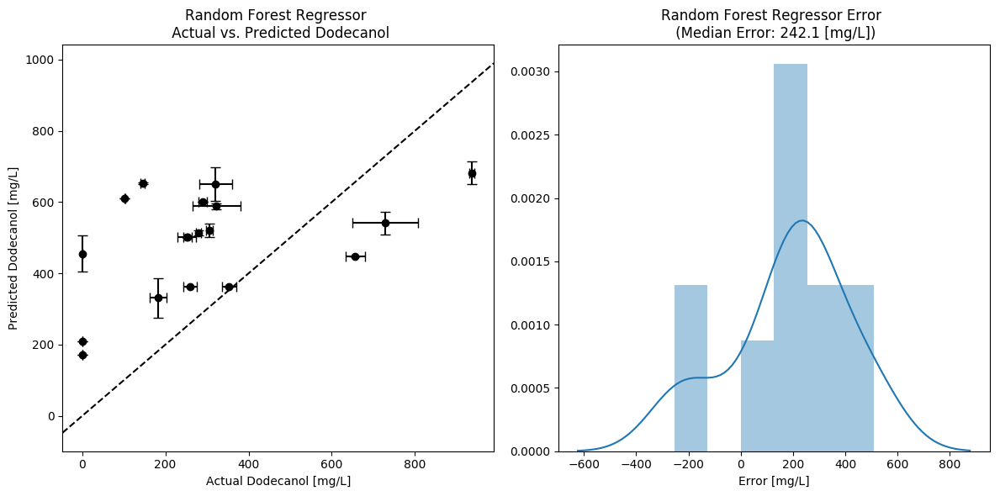

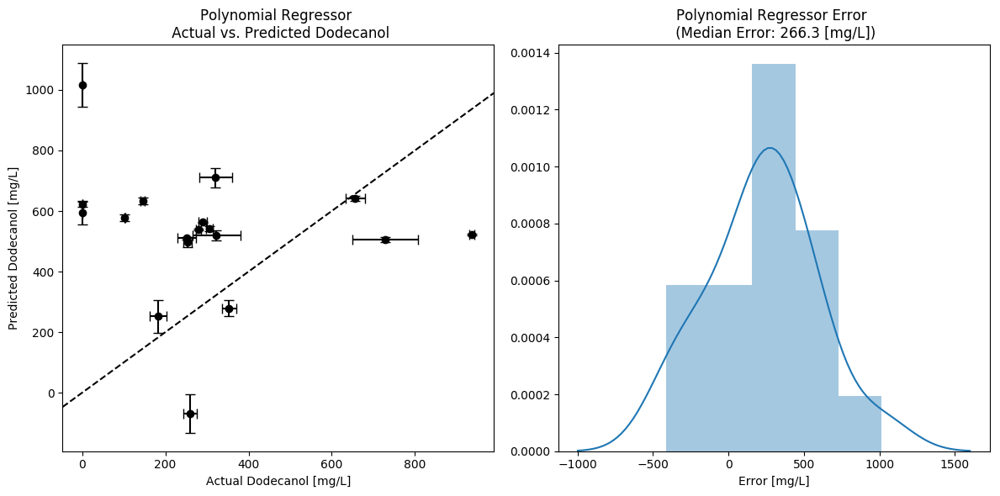

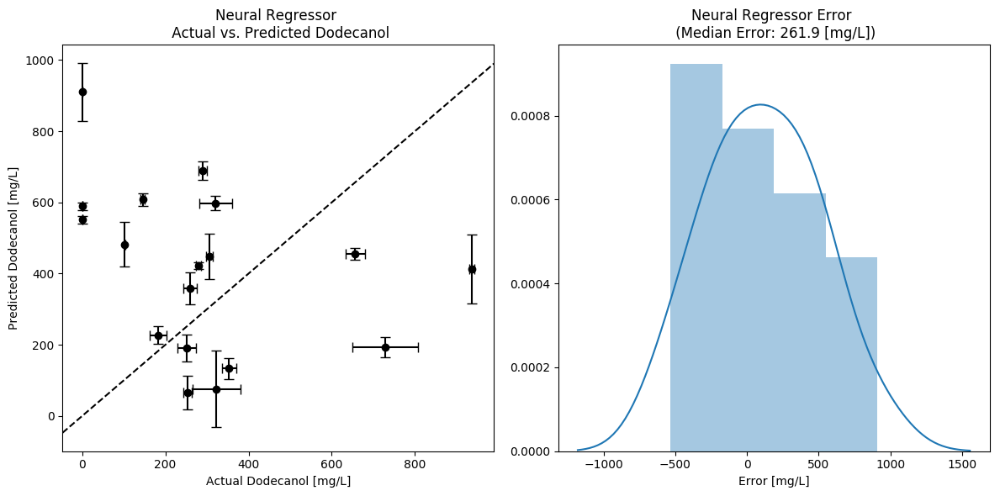

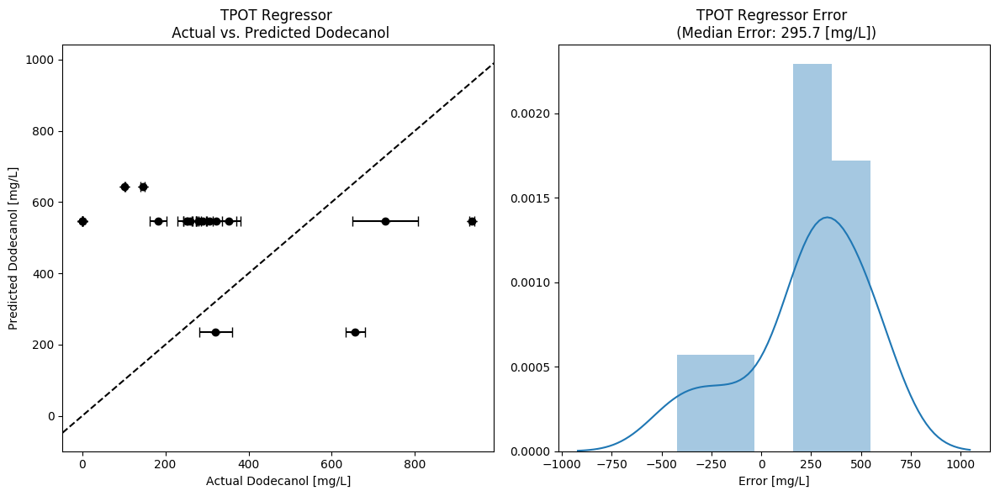

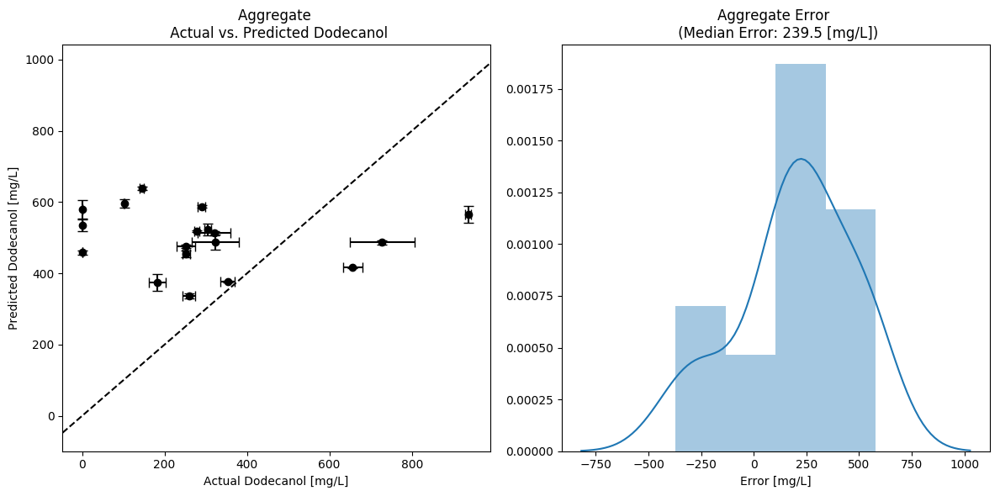

In [18]:
#Plot Predictions and Evaluate Accuracy
#display(df['Prediction'].loc[~pd.isnull(df['Prediction']).any(axis=1)])
import seaborn as sns
sns.reset_orig()

criteria = [('Metadata','Cycle'),('Metadata','Strain'),('Metadata','IPTG'),('Metadata','Batch')]
display(df.loc[~pd.isnull(df['Prediction']).any(axis=1)]*1000)
for regressor in df['Prediction'].columns: 
    X = df.loc[~pd.isnull(df['Prediction']).any(axis=1)]*1000
    X_mean = X.groupby(criteria).mean().loc[:,('Prediction',regressor)]    
    X_std = X.groupby(criteria).std().loc[:,('Prediction',regressor)]
    
    y = df.loc[~pd.isnull(df['Prediction']).any(axis=1)]*1000
    y_mean = y.groupby(criteria).mean().loc[:,('GC-MS','dodecan-1-ol')]
    y_std = y.groupby(criteria).std().loc[:,('GC-MS','dodecan-1-ol')]
    
    error = (X_mean-y_mean).dropna()

    #display(error)
    plt.figure(figsize=(12,6))

    plt.subplot(1,2,2)
    sns.distplot(error)
    distplot_ax = plt.gca()
    distplot_ax.set_title('{} Error \n (Median Error: {:0.1f} [mg/L])'.format(regressor,np.median(abs(error))))
    distplot_ax.set_xlabel('Error [mg/L]')

    plt.subplot(1,2,1)
    plt.errorbar(y_mean, X_mean, X_std, y_std,ls='none',fmt='ko',  zorder=1, markersize=6, capsize=4)
    #plt.scatter(y_mean,X_mean)
    
    scatter_ax = plt.gca()
    xmin,xmax = scatter_ax.get_xlim()
    scatter_ax.set_title('{} \n Actual vs. Predicted Dodecanol'.format(regressor))
    scatter_ax.set_xlabel('Actual Dodecanol [mg/L]')
    scatter_ax.set_ylabel('Predicted Dodecanol [mg/L]')
    scatter_ax.plot([xmin,xmax],[xmin,xmax],'k--')
    scatter_ax.set_xlim([xmin,xmax])
        
    plt.tight_layout()
    plt.savefig('figures/Model_Accuracy_{}.png'.format(regressor.replace(' ','')),dpi=600)
    plt.show()
    


In [19]:
#Create Plot Covering origin: (1,1,1), final point: (13,2,1) (Based on Strain C1-11)

#Calculate Bounds as Protein Concentrations
STRAIN_11 = df[('Metadata','Strain')]==11
CYCLE_1 = df[('Metadata','Cycle')]==1
concentrations = df.loc[STRAIN_11 & CYCLE_1]['Targeted Proteomics'][['sp|Q41635|FATB_UMBCA','sp|P69451|LCFA_ECOLI','tr|A1U3L3|A1U3L3_MARHV']].mean()
min_concentrations = concentrations.values
#max_concentrations = concentrations*np.array([13,2,1])
max_concentrations = concentrations*np.array([20,4,1])

#Make 100 Predictions in each dimension for all models and calculate aggrigate model structure. over this range.
xx = np.linspace(min_concentrations[0],max_concentrations[0],100)
yy = np.linspace(min_concentrations[1],max_concentrations[1],100)
XX,YY = np.meshgrid(xx,yy)

models = art.model_df['Model']

def aggrigate_model(x,y,reductase=min_concentrations[2]*1.3):
    '''Compute the aggrigate prediction using all constructed models'''
    p = []
    conc = np.array([x,y,reductase]).reshape(1, -1)
    for model in models:
        p.append(model.predict(conc)[0])
    
    z = sum(p*softmax(-10*scores[:,pathway-1]))
    return z


def predict_production(XX,YY):
    '''Create an array of predictions from a meshgrid'''
    v_agg_model = np.vectorize(aggrigate_model)
    ZZ = v_agg_model(XX,YY)
    return ZZ

ZZ = predict_production(XX,YY)

In [20]:
#Predict Strain 2-7 Using Aggrigate Model!
CYCLE_2 = df[('Metadata','Cycle')] == 2
STRAIN_7 = df[('Metadata','Strain')] == 7
BATCH = df[('Metadata','Batch')].isin([4,6])
s7_df = df.loc[CYCLE_2 & STRAIN_7 & BATCH].groupby([('Metadata','Strain')]).mean()

x = s7_df[('Targeted Proteomics','sp|Q41635|FATB_UMBCA')].values
y = s7_df[('Targeted Proteomics','sp|P69451|LCFA_ECOLI')].values
z = s7_df[('Targeted Proteomics','tr|A1U3L3|A1U3L3_MARHV')].values

aggrigate_model(x,y,reductase=z)

0.4448916206237429

In [21]:
#Model Weights Printing For Aggregate Model!
print(models)

weights = softmax(-10*scores[:,1])
print(weights)
Predictions2507 = [[0.43,4.1,1.5,0.55],
                   [0.49,3.4,1.3,0.55],
                   [0.49,2.5,1.2,0.55]]

agrigate_2507 = [sum([weight*val for weight,val in zip(weights,prediction)]) for prediction in Predictions2507]
print(agrigate_2507)


weights = softmax(-10*scores[:,0])
print(weights)
Predictions2220 = [[0.15,0.35,0.56,0.14],
                   [0.15,0.32,0.53,0.14]]
agrigate_2220 = [sum([weight*val for weight,val in zip(weights,prediction)]) for prediction in Predictions2220]
print(agrigate_2220)

Name
Random Forest Regressor    (DecisionTreeRegressor(criterion='mse', max_de...
Polynomial Regressor       Pipeline(memory=None,\n     steps=[('Scaler', ...
Neural Regressor           Pipeline(memory=None,\n     steps=[('Scaling',...
TPOT Regressor             Pipeline(memory=None,\n     steps=[('pca', PCA...
Name: Model, dtype: object
[0.30917879 0.20595506 0.14210252 0.34276362]
[1.3790363966149797, 1.2249980792530524, 1.0254282749927974]
[0.3084251  0.30467389 0.07777872 0.3091223 ]
[0.23973282777728028, 0.22825924969245226]


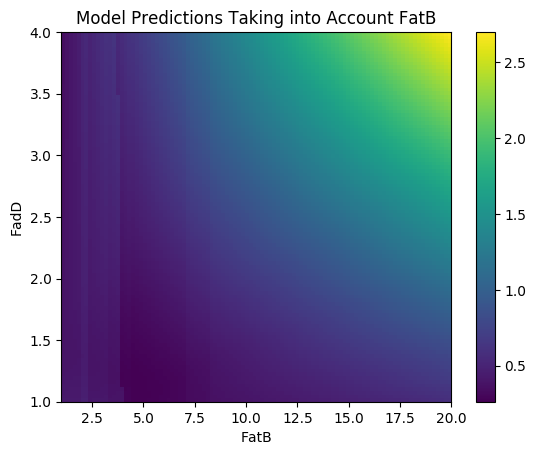

In [22]:
#plt.imshow(ZZ,origin='lower',extent=[1,13,1,2])
plt.imshow(ZZ,origin='lower',extent=[1,20,1,4])
ax = plt.gca()
ax.set_aspect(6)
plt.xlabel('FatB')
plt.ylabel('FadD')
plt.title('Model Predictions Taking into Account FatB')
plt.colorbar()#shrink=0.84)
plt.savefig('figures/model_slice.png')
plt.show()

Protocol Name                   EMOPEC                       \
Measurement Type   sp|P27250|AHR_ECOLI sp|P69451|LCFA_ECOLI   
(Metadata, Strain)                                            
5                                  0.0                 92.4   
7                                  0.0                 92.4   
8                                  0.0                 92.4   
9                                  0.0                 92.4   

Protocol Name                                                 \
Measurement Type   sp|Q41635|FATB_UMBCA sp|Q6F7B8|ACR1_ACIAD   
(Metadata, Strain)                                             
5                                  80.5                  0.0   
7                                  97.1                  0.0   
8                                  95.3                  0.0   
9                                  80.5                  0.0   

Protocol Name                                                           GC-MS  \
Measurement Type   tr|A1U2T0|A1U2T0_MARHV tr|A1U3L3|A1U3L3_MARHV dodecan-1-ol   
(Metadata, Strain)                                                              
5                                     0.0                   98.4     0.322967   
7                                     0.0                   98.4     0.832123   
8                                     0.0                   98.4     0.102413   
9                                     0.0                   98.4     0.145453   

Protocol Name                                                       ...     \
Measurement Type   hexadecan-1-ol octadecan-1-ol tetradecan-1-ol    ...      
(Metadata, Strain)                                                  ...      
5                        0.024033       0.043983        0.015557    ...      
7                        0.050860       0.086152        0.065077    ...      
8                        0.022910            NaN        0.003740    ...      
9                             NaN            NaN        0.012343    ...      

Protocol Name         Targeted Proteomics Metadata                      \
Measurement Type   tr|A1U3L3|A1U3L3_MARHV     Time Pathway Copy Number   
(Metadata, Strain)                                                       
5                           495606.000000       27       2          15   
7                           637326.833333       27       2          15   
8                           351473.000000       27       2          15   
9                           233550.000000       27       2          15   

Protocol Name                     GC-MS              Prediction  \
Measurement Type   Total Fatty Alcohols Random Forest Regressor   
(Metadata, Strain)                                                
5                              0.406540                0.588262   
7                              1.034212                0.611189   
8                              0.143047                0.610547   
9                              0.236387                0.652441   

Protocol Name                                                            \
Measurement Type   Polynomial Regressor Neural Regressor TPOT Regressor   
(Metadata, Strain)                                                        
5                              0.519814         0.076105       0.547796   
7                              0.514212         0.303408       0.547796   
8                              0.577421         0.482340       0.643025   
9                              0.633012         0.608223       0.643025   

Protocol Name                 
Measurement Type   Aggregate  
(Metadata, Strain)            
5                   0.487516  
7                   0.525751  
8                   0.596638  
9                   0.638928  

[4 rows x 81 columns]

['dodecan-1-ol', 'hexadecan-1-ol', 'octadecan-1-ol', 'tetradecan-1-ol', 'Total Fatty Alcohols']


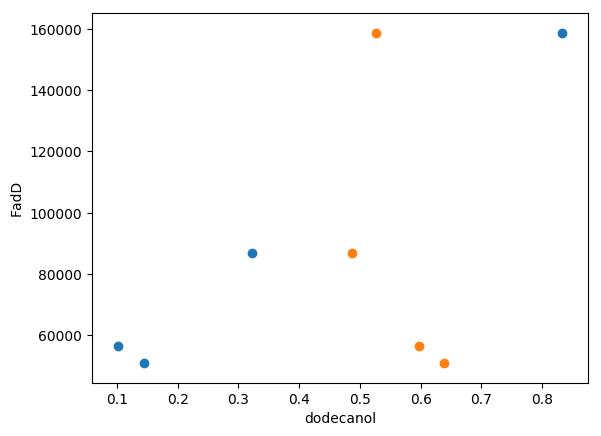

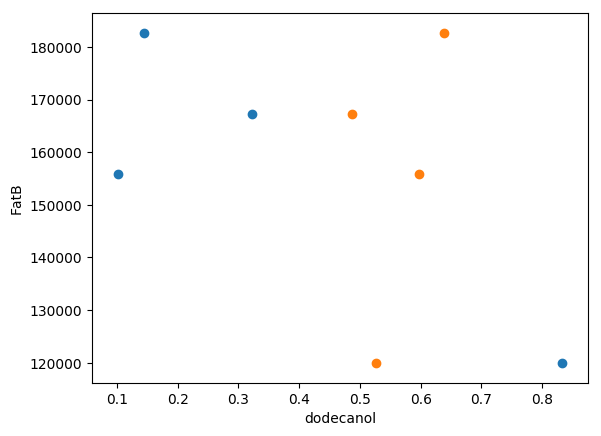

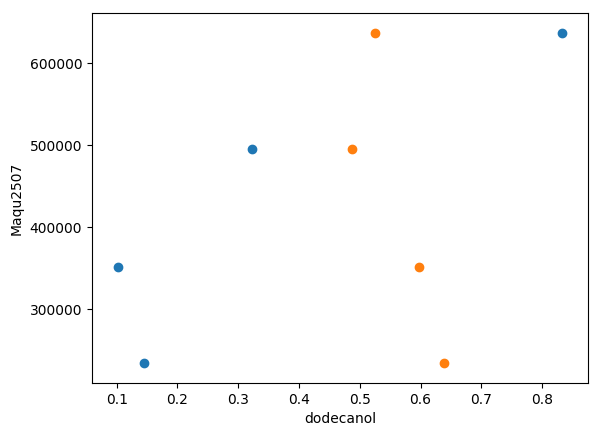

In [23]:
#Plot 5-9 
STRAINS_5to9 = df[('Metadata','Strain')].isin([5,6,7,8,9])
CYCLE_2 = df[('Metadata','Cycle')]==2
strain_df = df.loc[STRAINS_5to9 & CYCLE_2].groupby(('Metadata','Strain')).mean()
display(strain_df)

print(list(strain_df['GC-MS'].columns))
plt.scatter(strain_df[('GC-MS','dodecan-1-ol')],strain_df[('Targeted Proteomics','sp|P69451|LCFA_ECOLI')])
plt.scatter(strain_df[('Prediction','Aggregate')],strain_df[('Targeted Proteomics','sp|P69451|LCFA_ECOLI')])
plt.xlabel('dodecanol')
plt.ylabel('FadD')
plt.show()


plt.scatter(strain_df[('GC-MS','dodecan-1-ol')],strain_df[('Targeted Proteomics','sp|Q41635|FATB_UMBCA')])
plt.scatter(strain_df[('Prediction','Aggregate')],strain_df[('Targeted Proteomics','sp|Q41635|FATB_UMBCA')])
plt.xlabel('dodecanol')
plt.ylabel('FatB')
plt.show()


plt.scatter(strain_df[('GC-MS','dodecan-1-ol')],strain_df[('Targeted Proteomics','tr|A1U3L3|A1U3L3_MARHV')])
plt.scatter(strain_df[('Prediction','Aggregate')],strain_df[('Targeted Proteomics','tr|A1U3L3|A1U3L3_MARHV')])
plt.xlabel('dodecanol')
plt.ylabel('Maqu2507')
plt.show()

Independent Variables                       \
                        sp|P69451|LCFA_ECOLI sp|Q41635|FATB_UMBCA   
Line Name                                                           
C1-S1-B1.1-R1                       111883.0             131969.0   
C1-S1-B1.1-R2                       109006.0             155128.0   
C1-S1-B1.3-R1                        94257.0             142442.0   
C1-S1-B1.3-R2                        86387.0             137559.0   
C1-S1-B1.3-R3                        92864.0             140317.0   
C1-S10-B1.3-R1                      106078.0              77657.0   
C1-S10-B1.3-R2                      102990.0              74213.0   
C1-S10-B1.3-R3                      100254.0              74197.0   
C1-S11-B1.1-R1                      131484.0              73491.0   
C1-S11-B1.1-R2                      127385.0              76212.0   
C1-S11-B1.2-R1                       87148.0              61346.0   
C1-S11-B1.2-R2                       78968.0              69825.0   
C1-S11-B1.2-R3                       84297.0              67842.0   
C1-S11-B2.3-R1                      135925.0              81518.0   
C1-S11-B2.3-R2                      137966.0              80815.0   
C1-S11-B2.3-R3                      135445.0              83388.0   
C1-S11-B2.4-R1                      217404.0             105854.0   
C1-S11-B2.4-R2                      219170.0             116151.0   
C1-S11-B2.4-R3                      211659.0             117200.0   
C1-S11-B2.5-R1                      157833.0              67305.0   
C1-S11-B2.5-R1-IPTG0.5              146235.0              73874.0   
C1-S11-B2.5-R2                      164543.0              66426.0   
C1-S11-B2.5-R2-IPTG0.5              123769.0              68796.0   
C1-S11-B2.5-R3                      161957.0              77725.0   
C1-S11-B2.5-R3-IPTG0.5              131872.0              67059.0   
C1-S12-B1.1-R1                      516401.0              76399.0   
C1-S12-B1.1-R2                      530998.0              77474.0   
C1-S2-B1.1-R1                       106977.0             123692.0   
C1-S2-B1.1-R2                       110415.0             161836.0   
C1-S2-B1.3-R1                        97136.0             139410.0   
...                                      ...                  ...   
C1-S5-B1.3-R2                        83962.0             109847.0   
C1-S5-B1.3-R3                        90099.0             107696.0   
C1-S6-B1.3-R1                       167575.0              50149.0   
C1-S6-B1.3-R2                       186630.0              53004.0   
C1-S6-B1.3-R3                       213883.0              53533.0   
C1-S7-B1.3-R1                       145026.0             103613.0   
C1-S7-B1.3-R2                       142235.0             101283.0   
C1-S7-B1.3-R3                       136986.0             103892.0   
C1-S8-B1.1-R1                       165598.0             113884.0   
C1-S8-B1.1-R2                       169995.0             107398.0   
C1-S8-B1.3-R1                       123104.0             105707.0   
C1-S8-B1.3-R2                       125883.0             107000.0   
C1-S8-B1.3-R3                       124508.0             104239.0   
C1-S9-B1.1-R1                       745982.0             136812.0   
C1-S9-B1.1-R2                       810667.0             142616.0   
C2-S5-B2.3-R1                        82467.0             157963.0   
C2-S5-B2.3-R2                        85676.0             169402.0   
C2-S5-B2.3-R3                        92348.0             174537.0   
C2-S7-B2.3-R1                       153996.0             126561.0   
C2-S7-B2.3-R2                       156265.0             134496.0   
C2-S7-B2.3-R3                       159436.0             129435.0   
C2-S7-B2.5-R1                       162870.0             105572.0   
C2-S7-B2.5-R2                       155765.0             106636.0   
C2-S7-B2.5-R3                       163614.0             117044.0   
C2-S8-B2.3-R1        

Optimization Progress:  33%|███▎      | 40/120 [00:10<00:28,  2.80pipeline/s]

Generation 1 - Current best internal CV score: -0.04599634927450545


Optimization Progress:  50%|█████     | 60/120 [00:17<00:22,  2.71pipeline/s]

Generation 2 - Current best internal CV score: -0.04599634927450545


Optimization Progress:  67%|██████▋   | 80/120 [00:28<00:17,  2.26pipeline/s]

Generation 3 - Current best internal CV score: -0.04571902682918103


Optimization Progress:  83%|████████▎ | 100/120 [00:36<00:07,  2.73pipeline/s]

Generation 4 - Current best internal CV score: -0.0430692543926788


Generation 5 - Current best internal CV score: -0.0430692543926788

Best pipeline: RandomForestRegressor(ExtraTreesRegressor(input_matrix, bootstrap=True, max_features=0.25, min_samples_leaf=16, min_samples_split=19, n_estimators=100), bootstrap=False, max_features=0.7000000000000001, min_samples_leaf=3, min_samples_split=7, n_estimators=100)


,Model
Name,
Random Forest Regressor,"(DecisionTreeRegressor(criterion='mse', max_de..."
Polynomial Regressor,"Pipeline(memory=None,\n steps=[('Scaler', ..."
Neural Regressor,"Pipeline(memory=None,\n steps=[('Scaling',..."
TPOT Regressor,"Pipeline(memory=None,\n steps=[('stackinge..."


,Model,Predictions,Error Mean,Error Standard Deviation,MSE
Name,,,,,
Random Forest Regressor,"(DecisionTreeRegressor(criterion='mse', max_de...","[0.6267089166666666, 0.5999819166666667, 0.578...",-0.032931,0.213860,0.046821
Polynomial Regressor,"Pipeline(memory=None,\n steps=[('Scaler', ...","[0.5782119885782212, 0.4934706408950854, 0.561...",-0.062476,0.280546,0.082609
Neural Regressor,"Pipeline(memory=None,\n steps=[('Scaling',...","[0.5368866092336491, 0.2727033678561579, 0.487...",-0.061406,0.383674,0.150977
TPOT Regressor,"Pipeline(memory=None,\n steps=[('stackinge...","[0.5951346016666671, 0.5694474733333336, 0.582...",-0.033681,0.213345,0.046651


differential_evolution step 1: f(x)= -7.59981
differential_evolution step 2: f(x)= -7.59981
differential_evolution step 3: f(x)= -9.51453
differential_evolution step 4: f(x)= -9.51453
differential_evolution step 5: f(x)= -9.84983
differential_evolution step 6: f(x)= -9.84983
differential_evolution step 7: f(x)= -9.85459
differential_evolution step 8: f(x)= -10.2103
differential_evolution step 9: f(x)= -10.2103
differential_evolution step 10: f(x)= -10.6054
differential_evolution step 11: f(x)= -10.6054
differential_evolution step 12: f(x)= -10.8166
differential_evolution step 13: f(x)= -10.8166
differential_evolution step 14: f(x)= -10.8166
differential_evolution step 15: f(x)= -10.8166
differential_evolution step 16: f(x)= -10.8166
differential_evolution step 17: f(x)= -10.8166
differential_evolution step 18: f(x)= -10.8166
differential_evolution step 19: f(x)= -10.8166
differential_evolution step 20: f(x)= -10.8166
differential_evolution step 1: f(x)= -9.01294
differential_evolution 

,sp|P69451|LCFA_ECOLI,sp|Q41635|FATB_UMBCA,tr|A1U3L3|A1U3L3_MARHV,Success Probability,Random Forest Regressor,Polynomial Regressor,Neural Regressor,TPOT Regressor
0,134820.084290,102698.102049,6.149966e+05,10.816645,0.570259,0.544246,0.755288,0.624339
1,134695.619306,89557.420237,8.543504e+05,10.326620,0.555732,0.525863,0.474698,0.563424
2,136111.849886,103827.302510,1.102637e+06,10.348086,0.545567,0.460926,0.473050,0.618434
3,136074.350134,86809.676518,3.741096e+05,9.662692,0.634793,0.611747,0.570103,0.646115
4,338976.054249,104196.307167,9.770170e+05,3.412075,0.386165,0.944720,0.397524,0.515155
5,340931.617278,104086.100297,7.357757e+05,3.014699,0.332775,0.691549,0.606307,0.433450
6,976653.076171,104263.254289,1.159214e+06,1.973905,0.359279,3.294085,0.570788,0.518103
7,732424.352715,104591.834768,1.159996e+06,1.908553,0.359279,2.482078,0.378846,0.518103
8,992901.095159,104293.672756,9.076174e+05,1.702424,0.359279,2.098127,0.795837,0.518103
9,626343.431759,104603.082573,9.399751e+05,1.638680,0.298624,1.509931,0.486290,0.518103


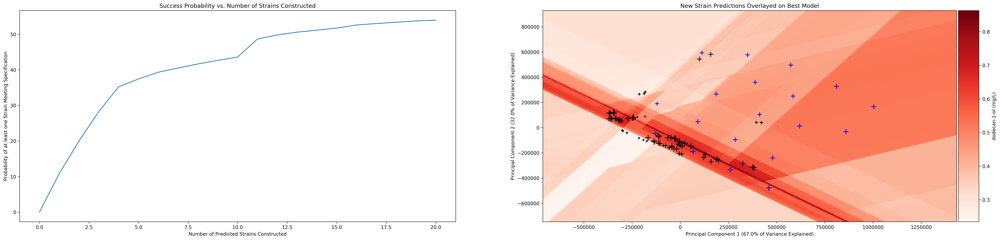

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



,sp|P69451|LCFA_ECOLI,sp|Q41635|FATB_UMBCA,tr|A1U3L3|A1U3L3_MARHV,Success Probability,Random Forest Regressor,Polynomial Regressor,Neural Regressor,TPOT Regressor
0,134820.084290,102698.102049,6.149966e+05,10.816645,0.570259,0.544246,0.755288,0.624339
1,134695.619306,89557.420237,8.543504e+05,10.326620,0.555732,0.525863,0.474698,0.563424
2,136111.849886,103827.302510,1.102637e+06,10.348086,0.545567,0.460926,0.473050,0.618434
3,136074.350134,86809.676518,3.741096e+05,9.662692,0.634793,0.611747,0.570103,0.646115
4,338976.054249,104196.307167,9.770170e+05,3.412075,0.386165,0.944720,0.397524,0.515155
5,340931.617278,104086.100297,7.357757e+05,3.014699,0.332775,0.691549,0.606307,0.433450
6,976653.076171,104263.254289,1.159214e+06,1.973905,0.359279,3.294085,0.570788,0.518103
7,732424.352715,104591.834768,1.159996e+06,1.908553,0.359279,2.482078,0.378846,0.518103
8,992901.095159,104293.672756,9.076174e+05,1.702424,0.359279,2.098127,0.795837,0.518103
9,626343.431759,104603.082573,9.399751e+05,1.638680,0.298624,1.509931,0.486290,0.518103


In [24]:
#Create Harry's Requested Model and Output Data
art_params['num_strains'] = 20
art_params['verbose'] = 2
art_params['tpot_dict'] = {'generations':5,'population_size':20}

#Make Predictions For final round with best performing pathway!
# Is it possible to run a model with the Cycle 1 Maqu_2507 strains plus the following strains:  
# C1-11 (Batch 2-3 and 2-5), C2-5, C2-7 (Batch 2-3 and 2-5), C2-8, C2-9?
strains_to_add = [(1,11,(4,6)),(2,5,(4,6)),(2,7,(4,6)),(2,8,(4,5,6)),(2,9,(4,5,6))]

MAQU2507 = df[('Metadata','Pathway')] == 2
CYCLE1_STRAINS = df[('Metadata','Cycle')] == 1

art_df = df.loc[(CYCLE1_STRAINS & MAQU2507)]#.groupby([('Metadata','Strain'),('Metadata','Batch')]).mean()

for cycle,strain,allowed_batches in strains_to_add:
    STRAIN = df[('Metadata','Strain')] == strain
    CYCLE = df[('Metadata','Cycle')] == cycle
    BATCH = df[('Metadata','Batch')].isin(allowed_batches)
    add_df = df.loc[STRAIN & CYCLE & BATCH]
    art_df = pd.concat([art_df,add_df])

feature_columns = list(art_df['Targeted Proteomics'].loc[:,group_df['TIR'].all(axis=0) > 0].columns)
target_column = 'dodecan-1-ol'
    

#Create dataframe and save out    
columns =  [('Targeted Proteomics',feature) for feature in feature_columns] + [('GC-MS','dodecan-1-ol')]
art_df = art_df.dropna(subset=columns)
edd_csv(art_df,columns)


#set features and target for simulation
art_params['target'] = ['dodecan-1-ol'] # Maybe use Growth Rate Instead??
art_params['features']  = feature_columns
    

#Run ART
art = recommendation_engine(**art_params)


#Generate Art Report
art.generate_report()

In [25]:
#Calculate Predicted Change from Previous Engineering Base Strain...
prediction_df = pd.read_csv('data/HarryModelPrediction.csv').sort_values('Success Probability',ascending=False)
display(prediction_df)

base_strain = 'C1-11'
CYCLE1 = df[('Metadata','Cycle')] == 1
STRAIN11 = df[('Metadata','Strain')] == 11
BATCH = df[('Metadata','Batch')] == 2
REPLICATE = df[('Metadata','Replicate')] == 2
Baseline = df.loc[CYCLE1 & STRAIN11 & BATCH & REPLICATE]['Targeted Proteomics'][['sp|P69451|LCFA_ECOLI','sp|Q41635|FATB_UMBCA','tr|A1U3L3|A1U3L3_MARHV']]

def fold_change(x,y):
    if x >= y:
        return x/y
    else:
        return -y/x
    

for protein in ['sp|P69451|LCFA_ECOLI','sp|Q41635|FATB_UMBCA','tr|A1U3L3|A1U3L3_MARHV']:
    calculate_fold = lambda x: fold_change(x,Baseline[protein].values[0])
    prediction_df[protein] = prediction_df[protein].apply(calculate_fold)
    
display(prediction_df)
prediction_df.to_csv('Harry_Model_Prediction_Outputs.csv')


,sp|P69451|LCFA_ECOLI,sp|Q41635|FATB_UMBCA,tr|A1U3L3|A1U3L3_MARHV,Success Probability,Random Forest Regressor,Polynomial Regressor,Neural Regressor,TPOT Regressor
0,196000.0,87770.70945,469000.0,10.985532,0.663030,0.487563,0.679874,0.683983
1,287000.0,89617.51027,809000.0,9.937798,0.287076,0.590980,0.433449,0.635628
3,152000.0,82997.25262,234000.0,8.998377,0.669670,0.587549,0.447697,0.662454
2,354000.0,90145.30637,1040000.0,8.650995,0.187734,0.886592,0.250932,0.652584
5,371000.0,200518.40040,590000.0,5.134003,0.376533,1.766350,-0.004396,0.589030
6,478000.0,216374.10640,874000.0,4.337729,0.379662,3.233324,-0.031169,0.636843
4,532000.0,215318.82190,1150000.0,4.315442,0.379662,4.278412,0.081192,0.611491
8,119000.0,91411.99646,990000.0,3.138190,0.549804,0.473577,0.444892,0.541834
9,335000.0,215991.41590,324000.0,3.002507,0.325879,1.440713,-0.019720,0.572433
7,680000.0,90603.98263,118000.0,1.879523,0.299378,-1.369383,0.687751,0.545157


,sp|P69451|LCFA_ECOLI,sp|Q41635|FATB_UMBCA,tr|A1U3L3|A1U3L3_MARHV,Success Probability,Random Forest Regressor,Polynomial Regressor,Neural Regressor,TPOT Regressor
0,2.482018,1.257010,1.157602,10.985532,0.663030,0.487563,0.679874,0.683983
1,3.634384,1.283459,1.996801,9.937798,0.287076,0.590980,0.433449,0.635628
3,1.924830,1.188647,-1.731402,8.998377,0.669670,0.587549,0.447697,0.662454
2,4.482828,1.291018,2.566963,8.650995,0.187734,0.886592,0.250932,0.652584
5,4.698106,2.871728,1.456258,5.134003,0.376533,1.766350,-0.004396,0.589030
6,6.053085,3.098806,2.157236,4.337729,0.379662,3.233324,-0.031169,0.636843
4,6.736906,3.083692,2.838469,4.315442,0.379662,4.278412,0.081192,0.611491
8,1.506940,1.309159,2.443551,3.138190,0.549804,0.473577,0.444892,0.541834
9,4.242225,3.093325,-1.250457,3.002507,0.325879,1.440713,-0.019720,0.572433
7,8.611083,1.297587,-3.433458,1.879523,0.299378,-1.369383,0.687751,0.545157


Independent Variables                       \
                        sp|P69451|LCFA_ECOLI sp|Q41635|FATB_UMBCA   
Line Name                                                           
C1-S1-B1.1-R1                       111883.0             131969.0   
C1-S1-B1.1-R2                       109006.0             155128.0   
C1-S1-B1.3-R1                        94257.0             142442.0   
C1-S1-B1.3-R2                        86387.0             137559.0   
C1-S1-B1.3-R3                        92864.0             140317.0   
C1-S10-B1.3-R1                      106078.0              77657.0   
C1-S10-B1.3-R2                      102990.0              74213.0   
C1-S10-B1.3-R3                      100254.0              74197.0   
C1-S11-B1.1-R1                      131484.0              73491.0   
C1-S11-B1.1-R2                      127385.0              76212.0   
C1-S11-B1.2-R1                       87148.0              61346.0   
C1-S11-B1.2-R2                       78968.0              69825.0   
C1-S11-B1.2-R3                       84297.0              67842.0   
C1-S11-B2.3-R1                      135925.0              81518.0   
C1-S11-B2.3-R2                      137966.0              80815.0   
C1-S11-B2.3-R3                      135445.0              83388.0   
C1-S11-B2.4-R1                      217404.0             105854.0   
C1-S11-B2.4-R2                      219170.0             116151.0   
C1-S11-B2.4-R3                      211659.0             117200.0   
C1-S11-B2.5-R1                      157833.0              67305.0   
C1-S11-B2.5-R1-IPTG0.5              146235.0              73874.0   
C1-S11-B2.5-R2                      164543.0              66426.0   
C1-S11-B2.5-R2-IPTG0.5              123769.0              68796.0   
C1-S11-B2.5-R3                      161957.0              77725.0   
C1-S11-B2.5-R3-IPTG0.5              131872.0              67059.0   
C1-S12-B1.1-R1                      516401.0              76399.0   
C1-S12-B1.1-R2                      530998.0              77474.0   
C1-S2-B1.1-R1                       106977.0             123692.0   
C1-S2-B1.1-R2                       110415.0             161836.0   
C1-S2-B1.3-R1                        97136.0             139410.0   
...                                      ...                  ...   
C2-S2-B2.5-R1-IPTG0.5               167943.0              11995.0   
C2-S2-B2.5-R2-IPTG0.5               152727.0              11225.0   
C2-S2-B2.5-R3-IPTG0.5               159938.0              14056.0   
C2-S3-B2.5-R1                       181131.0               7492.0   
C2-S3-B2.5-R2                       179799.0               8059.0   
C2-S3-B2.5-R3                       180935.0               8965.0   
C2-S4-B2.4-R1                       247382.0             280000.0   
C2-S4-B2.4-R2                       236865.0             272740.0   
C2-S4-B2.4-R3                       251422.0             303288.0   
C2-S4-B2.5-R1-IPTG0.5               136436.0             137348.0   
C2-S4-B2.5-R1-IPTG1.0               129527.0             127702.0   
C2-S4-B2.5-R2-IPTG0.5               132344.0             144136.0   
C2-S4-B2.5-R2-IPTG1.0               131082.0             131222.0   
C2-S4-B2.5-R3-IPTG0.5               134998.0             155000.0   
C2-S4-B2.5-R3-IPTG1.0               126337.0             134397.0   
C2-S5-B2.3-R1                        82467.0             157963.0   
C2-S5-B2.3-R2                        85676.0             169402.0   
C2-S5-B2.3-R3                        92348.0             174537.0   
C2-S7-B2.3-R1                       153996.0             126561.0   
C2-S7-B2.3-R2                       156265.0             134496.0   
C2-S7-B2.3-R3                       159436.0             129435.0   
C2-S7-B2.5-R1                       162870.0             105572.0   
C2-S7-B2.5-R2                       155765.0             106636.0   
C2-S7-B2.5-R3                       163614.0             117044.0   
C2-S8-B2.3-R1        

Optimization Progress:  33%|███▎      | 40/120 [00:11<00:33,  2.40pipeline/s]

Generation 1 - Current best internal CV score: -0.05623710162091973


Optimization Progress:  50%|█████     | 60/120 [00:18<00:19,  3.11pipeline/s]

Generation 2 - Current best internal CV score: -0.05623710162091973


Optimization Progress:  67%|██████▋   | 80/120 [00:27<00:17,  2.23pipeline/s]

Generation 3 - Current best internal CV score: -0.05623710162091973


Optimization Progress:  83%|████████▎ | 100/120 [00:33<00:05,  3.74pipeline/s]

Generation 4 - Current best internal CV score: -0.05238600709982988


Generation 5 - Current best internal CV score: -0.0522166702030795

Best pipeline: RandomForestRegressor(OneHotEncoder(input_matrix, minimum_fraction=0.1, sparse=False), bootstrap=False, max_features=0.9500000000000001, min_samples_leaf=3, min_samples_split=5, n_estimators=100)


,Model
Name,
Random Forest Regressor,"(DecisionTreeRegressor(criterion='mse', max_de..."
Polynomial Regressor,"Pipeline(memory=None,\n steps=[('Scaler', ..."
Neural Regressor,"Pipeline(memory=None,\n steps=[('Scaling',..."
TPOT Regressor,"Pipeline(memory=None,\n steps=[('onehotenc..."


,Model,Predictions,Error Mean,Error Standard Deviation,MSE
Name,,,,,
Random Forest Regressor,"(DecisionTreeRegressor(criterion='mse', max_de...","[0.543431, 0.5813625000000001, 0.6166655, 0.57...",-0.043772,0.198525,0.041328
Polynomial Regressor,"Pipeline(memory=None,\n steps=[('Scaler', ...","[0.47303081442087946, 0.4491116683529319, 0.46...",-0.032737,0.272295,0.075216
Neural Regressor,"Pipeline(memory=None,\n steps=[('Scaling',...","[0.5676065426637111, 0.4043522510226796, 0.534...",-0.082954,0.385539,0.155522
TPOT Regressor,"Pipeline(memory=None,\n steps=[('onehotenc...","[0.4783273799999998, 0.5967676649999998, 0.563...",-0.052516,0.199365,0.042504


differential_evolution step 1: f(x)= -4.60099
differential_evolution step 2: f(x)= -4.60099
differential_evolution step 3: f(x)= -9.22788
differential_evolution step 4: f(x)= -9.22788
differential_evolution step 5: f(x)= -9.87404
differential_evolution step 6: f(x)= -9.87404
differential_evolution step 7: f(x)= -9.87404
differential_evolution step 8: f(x)= -9.91208
differential_evolution step 9: f(x)= -10.1142
differential_evolution step 10: f(x)= -10.1142
differential_evolution step 11: f(x)= -10.3006
differential_evolution step 12: f(x)= -10.4668
differential_evolution step 13: f(x)= -10.5328
differential_evolution step 14: f(x)= -10.5328
differential_evolution step 15: f(x)= -10.5328
differential_evolution step 16: f(x)= -10.5328
differential_evolution step 17: f(x)= -10.5328
differential_evolution step 18: f(x)= -10.5925
differential_evolution step 19: f(x)= -10.5925
differential_evolution step 20: f(x)= -10.5925
differential_evolution step 21: f(x)= -10.6566
differential_evolution

,sp|P69451|LCFA_ECOLI,sp|Q41635|FATB_UMBCA,tr|A1U3L3|A1U3L3_MARHV,Success Probability,Random Forest Regressor,Polynomial Regressor,Neural Regressor,TPOT Regressor
0,142621.758556,82876.460165,2.263834e+05,10.719017,0.540778,0.511262,0.467972,0.632970
1,149511.348119,89844.805893,5.968752e+05,7.490164,0.493787,0.420263,0.507085,0.623037
2,149193.198646,82683.992829,9.031306e+05,5.414192,0.546812,0.351206,0.449536,0.656762
3,149753.301652,90914.705513,1.255967e+06,5.036563,0.546812,0.266836,0.228806,0.619690
4,184037.811576,90717.017508,1.593347e+06,4.932844,0.569543,0.176671,0.142789,0.631789
5,184040.166481,90812.196813,1.955487e+06,4.890421,0.569543,0.092590,0.082986,0.565642
6,385586.711920,80920.098564,4.066074e+05,1.438029,0.352968,0.354726,0.417899,0.241820
7,985210.819935,73518.559248,3.747000e+05,0.897051,0.420904,-0.001882,1.001065,0.288546
8,411319.970273,83391.588419,7.512246e+05,0.721522,0.200377,0.270313,0.373911,0.252027
9,987861.206612,81210.528723,7.060091e+05,0.593525,0.297232,0.002295,0.748400,0.306230


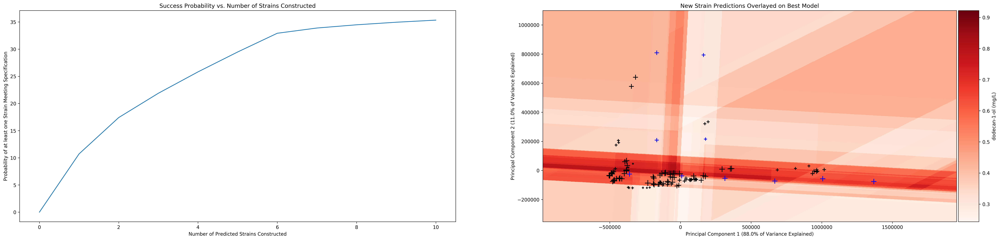

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



,sp|P69451|LCFA_ECOLI,sp|Q41635|FATB_UMBCA,tr|A1U3L3|A1U3L3_MARHV,Success Probability,Random Forest Regressor,Polynomial Regressor,Neural Regressor,TPOT Regressor
0,142621.758556,82876.460165,2.263834e+05,10.719017,0.540778,0.511262,0.467972,0.632970
1,149511.348119,89844.805893,5.968752e+05,7.490164,0.493787,0.420263,0.507085,0.623037
2,149193.198646,82683.992829,9.031306e+05,5.414192,0.546812,0.351206,0.449536,0.656762
3,149753.301652,90914.705513,1.255967e+06,5.036563,0.546812,0.266836,0.228806,0.619690
4,184037.811576,90717.017508,1.593347e+06,4.932844,0.569543,0.176671,0.142789,0.631789
5,184040.166481,90812.196813,1.955487e+06,4.890421,0.569543,0.092590,0.082986,0.565642
6,385586.711920,80920.098564,4.066074e+05,1.438029,0.352968,0.354726,0.417899,0.241820
7,985210.819935,73518.559248,3.747000e+05,0.897051,0.420904,-0.001882,1.001065,0.288546
8,411319.970273,83391.588419,7.512246e+05,0.721522,0.200377,0.270313,0.373911,0.252027
9,987861.206612,81210.528723,7.060091e+05,0.593525,0.297232,0.002295,0.748400,0.306230


In [26]:
#Set Art to Make 10 Predictions
art_params['num_strains'] = 10
art_params['verbose'] = 2


#Make Predictions For final round with best performing pathway!
MAQU2507 = df[('Metadata','Pathway')] == 2
art_df = df.loc[AJINOMOTO_STRAINS & MAQU2507]#.groupby([('Metadata','Strain'),('Metadata','Batch')]).mean()

feature_columns = list(art_df['Targeted Proteomics'].loc[:,group_df['TIR'].all(axis=0) > 0].columns)
target_column = 'dodecan-1-ol'
    

#Create dataframe and save out    
columns =  [('Targeted Proteomics',feature) for feature in feature_columns] + [('GC-MS','dodecan-1-ol')]
art_df = art_df.dropna(subset=columns)
edd_csv(art_df,columns)


#set features and target for simulation
art_params['target'] = ['dodecan-1-ol'] # Maybe use Growth Rate Instead??
art_params['features']  = feature_columns
    

#Run ART
art = recommendation_engine(**art_params)


#Generate Art Report
art.generate_report()

### 4. Correlations
We perform a linear correlational analysis to search for relationships in the multiomics data 

In [27]:
import itertools

# Calculate Covariance For All Variables then create a table and sort by correlation coefficient
measurement_headers = ['GC-MS','Targeted Proteomics','HPLC','NIMS','TIR','LC-MS','OD600']
zero_drop_columns = ['TIR','Targeted Proteomics','NIMS']

total_comparisons = 0
data = []
corr_df = df.loc[:,df.columns.get_level_values(0).isin(measurement_headers)]

#Replace Zeros with NaNs for all zero_drop_columns
corr_df.loc[:,corr_df.columns[corr_df.columns.get_level_values(0).isin(zero_drop_columns)]].replace(0,float('NaN'),inplace=True)

for col1,col2 in itertools.combinations(corr_df.columns, 2):
    
    test_df = corr_df[[col1,col2]].dropna()
    if len(test_df) > 0:
        n_points = len(test_df)
        corr,p_val = stats.pearsonr(test_df[col1],test_df[col2])
        data.append([col1,col2,corr,p_val,n_points])
        total_comparisons +=1

#print(total_comparisons)
corr_df = pd.DataFrame(data,columns=['Feature 1','Feature 2','R Value','P Value','Num Points'])

#Add R^2 Column
corr_df['R^2 Value'] = corr_df['R Value']**2
corr_df = corr_df.sort_values('R^2 Value',ascending=False)

SIGNIFICANT = corr_df['P Value'] < 0.05/total_comparisons
ENOUGH_DATA = corr_df['Num Points']>10
CONTAINS = lambda x: (corr_df['Feature 1'] == x) | (corr_df['Feature 2'] == x)

#Show best correlations with Production
display(corr_df.loc[SIGNIFICANT & ENOUGH_DATA & CONTAINS(('GC-MS', 'dodecan-1-ol'))].sort_values('R^2 Value',ascending=False))
display(corr_df.loc[SIGNIFICANT & ENOUGH_DATA & CONTAINS(('OD600', 'Optical Density'))])

#Show all correlations
display(corr_df.loc[SIGNIFICANT & ENOUGH_DATA])
corr_df.loc[SIGNIFICANT & ENOUGH_DATA].to_csv('data/correlations.csv')

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:3010: RuntimeWarning:

invalid value encountered in double_scalars



,Feature 1,Feature 2,R Value,P Value,Num Points,R^2 Value
47,"(GC-MS, dodecan-1-ol)","(NIMS, Tridecanal)",-0.712263,2.628609e-13,78,0.507319
61,"(GC-MS, dodecan-1-ol)","(GC-MS, Total Fatty Alcohols)",0.464215,1.445691e-12,209,0.215496
54,"(GC-MS, dodecan-1-ol)","(TIR, tr|A1U3L3|A1U3L3_MARHV)",0.457896,1.206991e-12,217,0.209668
3,"(GC-MS, dodecan-1-ol)","(HPLC, Acetate)",-0.388997,2.870824e-07,163,0.151319
39,"(GC-MS, dodecan-1-ol)","(NIMS, Dodecenal (12:1))",0.378780,9.765813e-08,186,0.143474
4,"(GC-MS, dodecan-1-ol)","(HPLC, D-Glucose)",-0.345266,3.748675e-06,171,0.119209
45,"(GC-MS, dodecan-1-ol)","(NIMS, Tetradecanal)",-0.317195,1.027774e-05,186,0.100612
53,"(GC-MS, dodecan-1-ol)","(TIR, tr|A1U2T0|A1U2T0_MARHV)",-0.311787,2.817870e-06,217,0.097211
49,"(GC-MS, dodecan-1-ol)","(TIR, sp|P27250|AHR_ECOLI)",-0.291845,1.243475e-05,217,0.085173
55,"(GC-MS, dodecan-1-ol)","(Targeted Proteomics, sp|P27250|AHR_ECOLI)",-0.291472,1.468508e-05,214,0.084956


,Feature 1,Feature 2,R Value,P Value,Num Points,R^2 Value
343,"(HPLC, D-Glucose)","(OD600, Optical Density)",-0.740835,1.859335e-18,99,0.548837
1833,"(OD600, Optical Density)","(Targeted Proteomics, sp|Q41635|FATB_UMBCA)",-0.498542,1.653490e-08,114,0.248544


,Feature 1,Feature 2,R Value,P Value,Num Points,R^2 Value
999,"(LC-MS, Flavin adenine dinucleotide oxidized)","(LC-MS, Nicotinamide adenine dinucleotide)",1.000000,7.989019e-180,31,1.000000
492,"(LC-MS, ADP)","(LC-MS, Stearic acid)",0.999919,9.216879e-32,18,0.999838
869,"(LC-MS, Decanoic acid)","(LC-MS, Myristic acid)",0.999793,1.306090e-33,21,0.999586
488,"(LC-MS, ADP)","(LC-MS, Palmitic acid)",0.999590,1.454744e-24,17,0.999179
1435,"(LC-MS, Palmitic acid)","(LC-MS, Stearic acid)",0.998066,2.480940e-35,30,0.996135
955,"(LC-MS, Dodecanoyl-CoA (n-C12:0CoA))","(LC-MS, Lauric acid)",0.997001,1.900595e-12,12,0.994011
1204,"(LC-MS, Myristic acid)","(LC-MS, Stearic acid)",0.993187,5.592673e-23,25,0.986419
1200,"(LC-MS, Myristic acid)","(LC-MS, Palmitic acid)",0.991567,1.252945e-15,18,0.983204
473,"(LC-MS, ADP)","(LC-MS, Decanoic acid)",0.990776,1.136562e-12,15,0.981638
880,"(LC-MS, Decanoic acid)","(LC-MS, Stearic acid)",0.985623,6.415699e-17,22,0.971453


/usr/local/lib/python3.7/site-packages/pandas/core/frame.py:3798: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



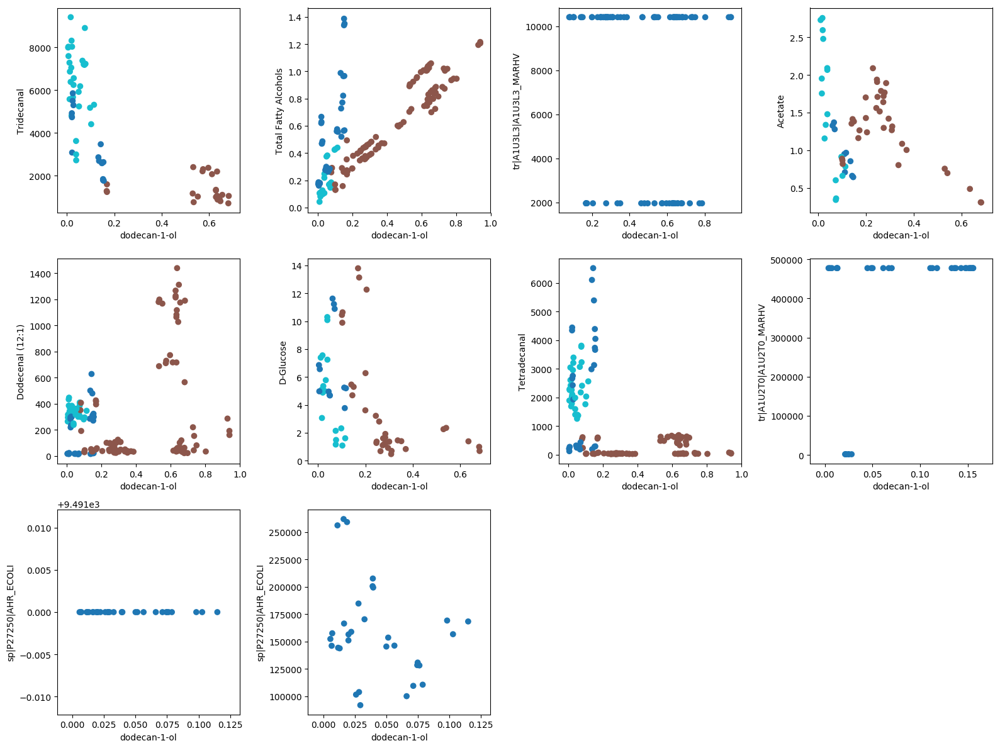

In [28]:
#Plot Significant Correlations
plot_df = corr_df.loc[SIGNIFICANT & ENOUGH_DATA & CONTAINS(('GC-MS', 'dodecan-1-ol'))].head(12)

plt.figure(figsize=(16,12))
for i,row in enumerate(plot_df.iterrows()):
    
    index,row = row
    col1 = row['Feature 1']
    col2 = row['Feature 2']
    
    #Remove NaNs and Zeros
    temp_df = df[[col1,col2,('Metadata','Pathway')]]
    temp_df.replace(0,float('NaN'),inplace=True)
    temp_df = temp_df.dropna()
    
    #Plot Correlation
    plt.subplot(3,4,i+1)
    plt.scatter(temp_df[col1],temp_df[col2],c=temp_df[('Metadata','Pathway')],cmap='tab10')
    plt.xlabel(col1[1])
    plt.ylabel(col2[1])
    
    #if i == 9:
    #    display(temp_df)

plt.tight_layout()
plt.show()
                       

### 5. Strain Summary 
A summary of the strains created including a Strain Heatmap, Total strain production for the range of strains tested, and a set of 3d strain plots illustrating production.